<a href="https://colab.research.google.com/github/Pujitha2005/Fruit/blob/main/AI_Tata_Retail_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# loading the dataset and necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from datetime import datetime
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.neighbors import KNeighborsClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.impute import SimpleImputer
from sklearn.metrics import davies_bouldin_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


data1 = pd.read_csv("data.csv", encoding='latin-1')
data = pd.read_csv("data.csv", encoding='latin-1')

data1.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,01-12-2010 08:26,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,01-12-2010 08:26,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,01-12-2010 08:28,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,01-12-2010 08:28,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,01-12-2010 08:34,1.69,13047.0,United Kingdom


In [ ]:
data1.info()
data1.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


Visualizing about the volume of dataset.

In [ ]:
data1.shape

(541909, 8)

Looking for missing values in the dataset rows.

In [ ]:
#missing values
missing_values = data1.isnull().sum()

# count of missing values
print(missing_values)
missing_percentage = (data1.isnull().sum() / len(data1)) * 100
print(missing_percentage)

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64
InvoiceNo       0.000000
StockCode       0.000000
Description     0.268311
Quantity        0.000000
InvoiceDate     0.000000
UnitPrice       0.000000
CustomerID     24.926694
Country         0.000000
dtype: float64


Finding Number of duplicate values in row.

In [ ]:
duplicate=data1[data1.duplicated()]
print (f"Number of duplicate rows: {duplicate.shape[0]}")

Number of duplicate rows: 5268


Removing the said valuves.

In [ ]:
#drop the duplicate
rows_before_dropping= len(data1)

data1 = data1.drop_duplicates()

rows_after_dropping= len(data1)
rows_dropped = rows_before_dropping - rows_after_dropping

print(f"Rows before dropping duplicates: {rows_before_dropping}")
print(f"Rows after dropping duplicates: {rows_after_dropping}")
print(f"Number of rows dropped: {rows_dropped}")

Rows before dropping duplicates: 541909
Rows after dropping duplicates: 536641
Number of rows dropped: 5268


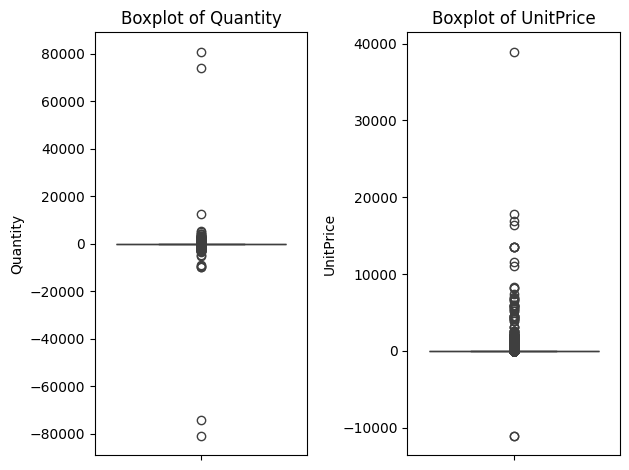

In [ ]:
#detcting outlier

plt.subplot(1, 2, 1)
sns.boxplot(data1['Quantity'])
plt.title('Boxplot of Quantity')

#UnitPrice
plt.subplot(1, 2, 2)
sns.boxplot(data1['UnitPrice'])
plt.title('Boxplot of UnitPrice')

plt.tight_layout()
plt.show()


##################
Do not drop the negative Values.

Since negative quantity just means returns we need to find what negative unit price means.

In [ ]:
data4=data1.copy()

In [ ]:
data4 = data4[(data4['UnitPrice'] < 0)]
data4.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
299983,A563186,B,Adjust bad debt,1,12-08-2011 14:51,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,12-08-2011 14:52,-11062.06,NaN,United Kingdom


Since it is just adjusting bad debt we can remove it from the sales data as it does not contribute to sales.


In [ ]:
#drop out negative Quantity and Unitprice

data1 = data1[(data1['Quantity'] >= 0) & (data1['UnitPrice'] >= 0)]
data1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom


In [ ]:
#null value median

description_impute = data1.groupby('StockCode')['Description'].apply(lambda x: x.mode()[0] if not x.mode().empty else "Unknown Item")
data1['Description'] = data1['Description'].fillna(data1['StockCode'].map(description_impute))


print("\nMissing values after handling:")
print(data1.isnull().sum())



Missing values after handling:
InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     133320
Country             0
dtype: int64


Displaying name of columns for our convenience.

In [ ]:
print(data1.columns)

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')


Checking for NaN values.

In [ ]:
print(data1.isna().sum())


InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     133320
Country             0
dtype: int64


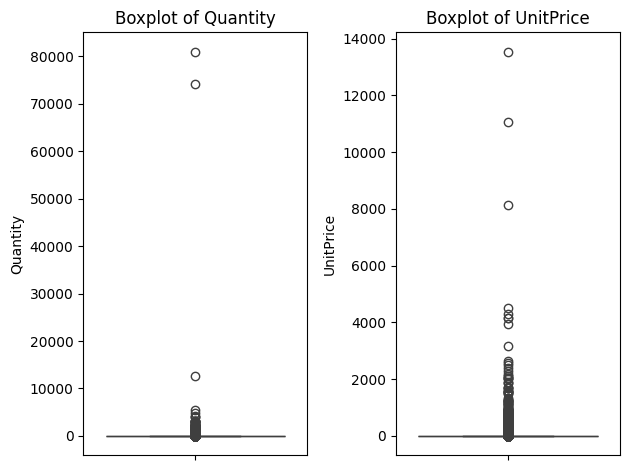

In [ ]:
#detecting outlier

plt.subplot(1, 2, 1)
sns.boxplot(data1['Quantity'])
plt.title('Boxplot of Quantity')

#UnitPrice
plt.subplot(1, 2, 2)
sns.boxplot(data1['UnitPrice'])
plt.title('Boxplot of UnitPrice')

plt.tight_layout()
plt.show()



Normalizing the Boxplot.

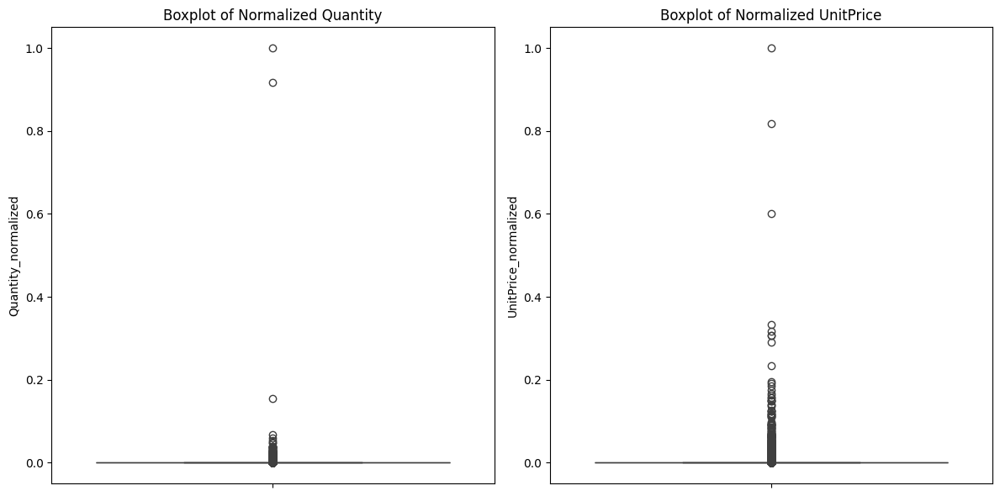

In [ ]:
min_max_scaler = MinMaxScaler()
data1['Quantity_normalized'] = min_max_scaler.fit_transform(data1[['Quantity']])
data1['UnitPrice_normalized'] = min_max_scaler.fit_transform(data1[['UnitPrice']])


plt.figure(figsize=(12, 6))

# Visual of Normalized Quantity
plt.subplot(1, 2, 1)
sns.boxplot(data1['Quantity_normalized'])
plt.title('Boxplot of Normalized Quantity')


plt.subplot(1, 2, 2)
sns.boxplot(data1['UnitPrice_normalized'])
plt.title('Boxplot of Normalized UnitPrice')

plt.tight_layout()
plt.show()

Deriving a new column "Revenue". where
[revenue=unitprice * quantity]

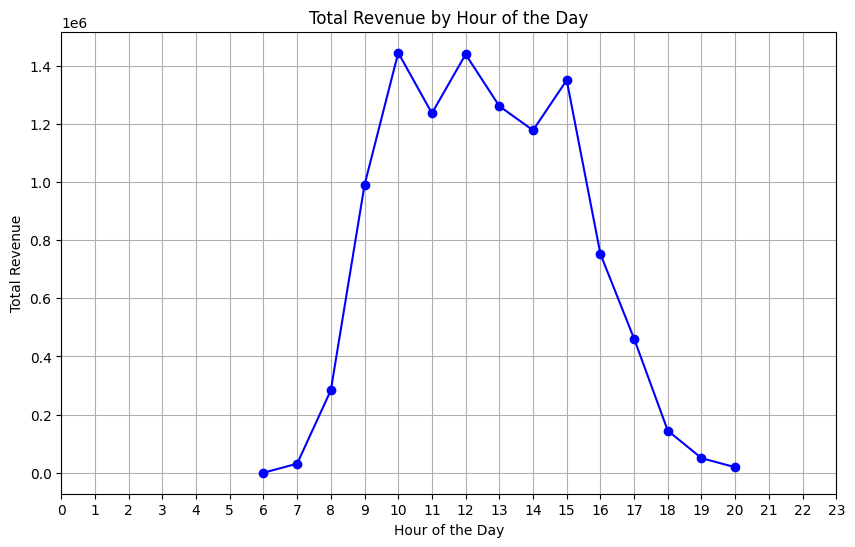

In [ ]:
# calculate revenue
data1['Revenue'] = data1['UnitPrice'] * data1['Quantity']

#invoice date hourly
data1['InvoiceDate'] = pd.to_datetime(data1['InvoiceDate'], format='%d-%m-%Y %H:%M')
data1['Hour'] = data1['InvoiceDate'].dt.hour

# group the data hour by hour
hourly_revenue = data1.groupby('Hour')['Revenue'].sum()

plt.figure(figsize=(10, 6))
hourly_revenue.plot(kind='line', marker='o', color='b')
plt.title('Total Revenue by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Revenue')
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()

Insight- We can see in the Above graph that revenue is highest around 9:00 am to 4:00 pm.

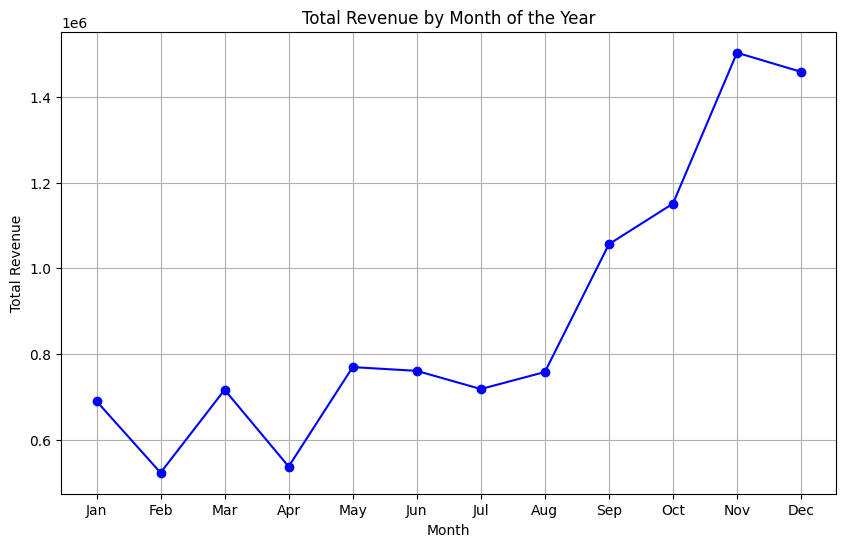

In [ ]:

data1['InvoiceDate'] = pd.to_datetime(data1['InvoiceDate'], format='%d-%m-%Y %H:%M')
data1['Month'] = data1['InvoiceDate'].dt.month

monthly_revenue = data1.groupby('Month')['Revenue'].sum()

plt.figure(figsize=(10, 6))
monthly_revenue.plot(kind='line', marker='o', color='b')

plt.title('Total Revenue by Month of the Year')
plt.xlabel('Month')
plt.ylabel('Total Revenue')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

Insight-In the above graph we can see that sales increase from August till January.

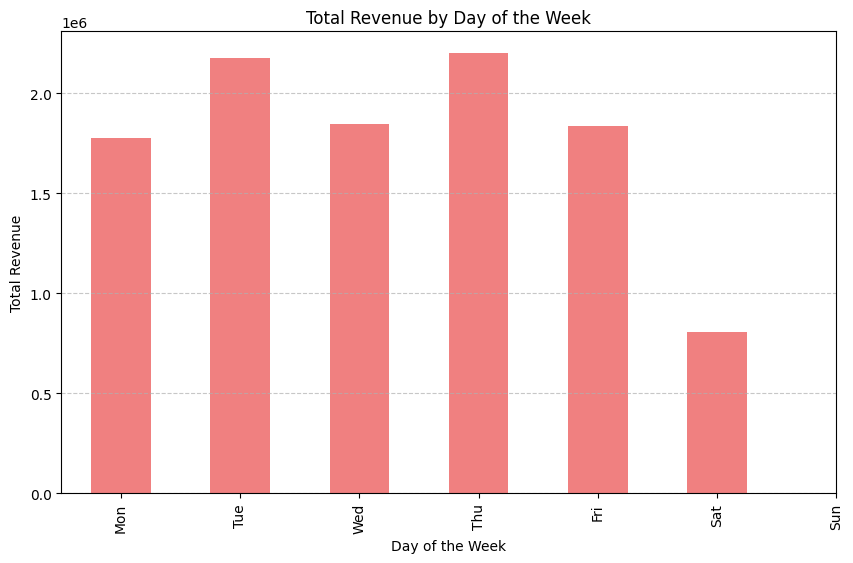

In [ ]:

data1['InvoiceDate'] = pd.to_datetime(data1['InvoiceDate'], format='%d-%m-%Y %H:%M')
data1['DayOfWeek'] = data1['InvoiceDate'].dt.dayofweek


daily_revenue = data1.groupby('DayOfWeek')['Revenue'].sum()


plt.figure(figsize=(10, 6))
daily_revenue.plot(kind='bar', color='lightcoral')

plt.title('Total Revenue by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Revenue')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

Now we can analyse the trend by countries.

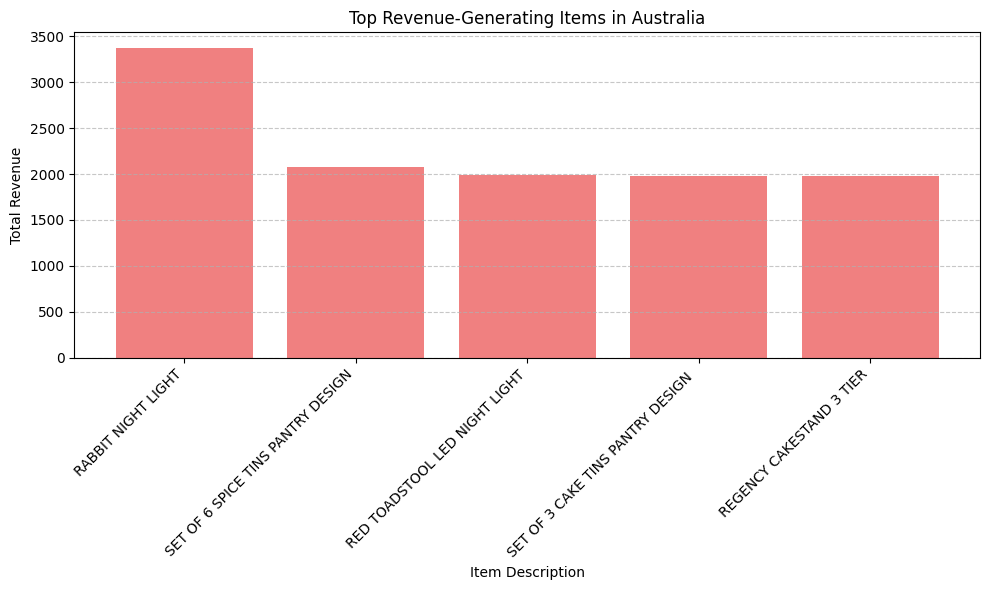

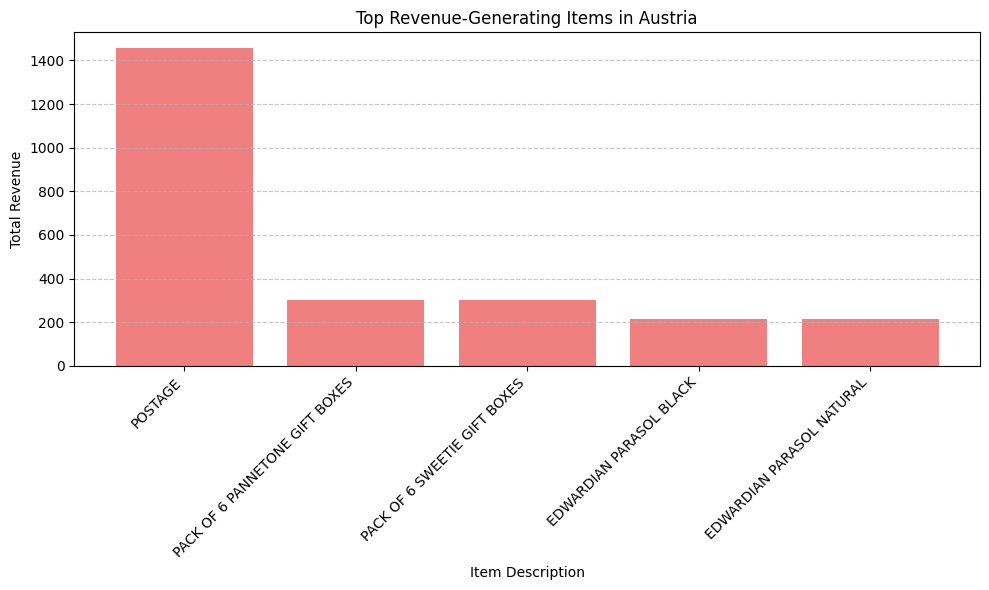

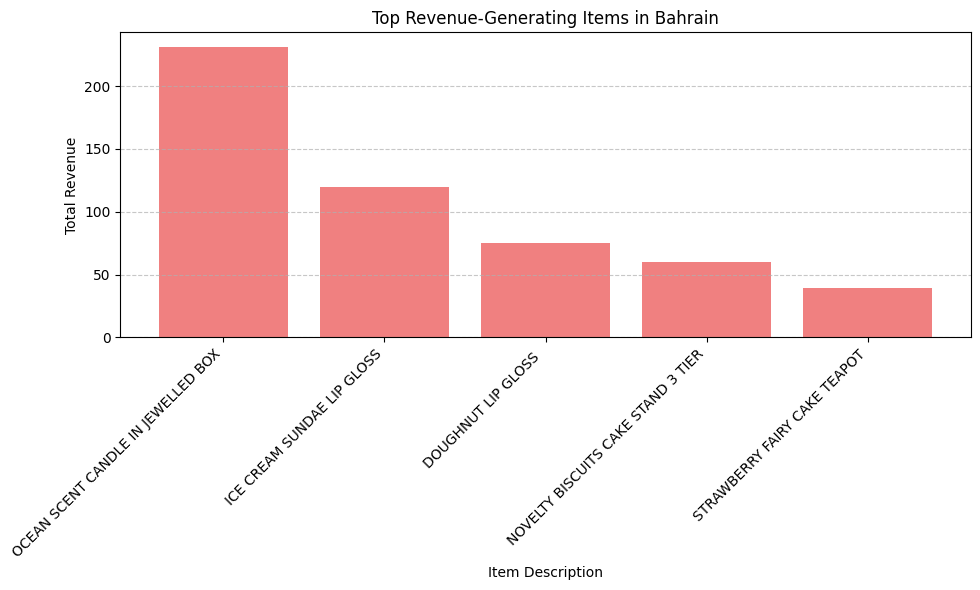

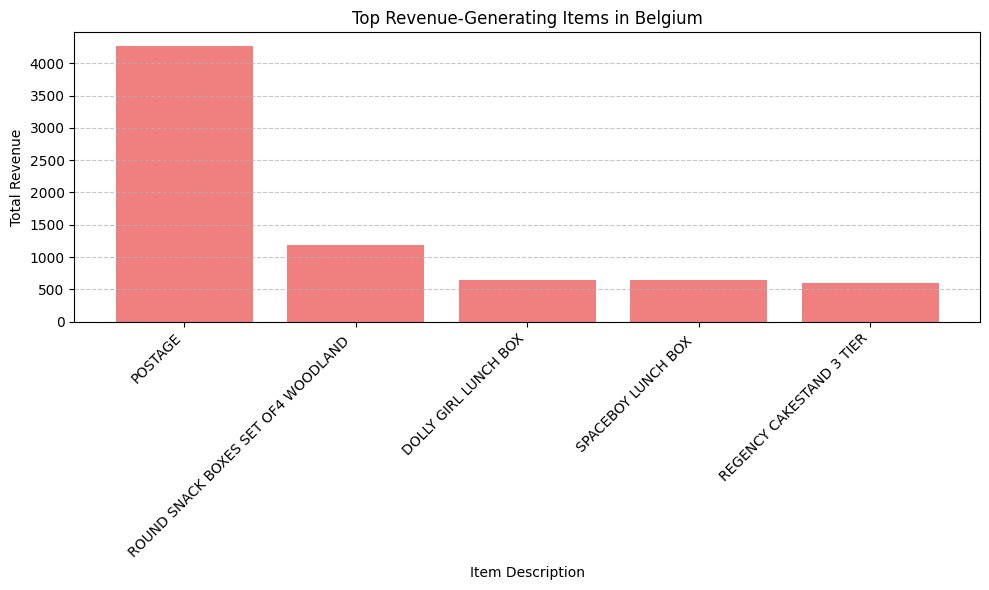

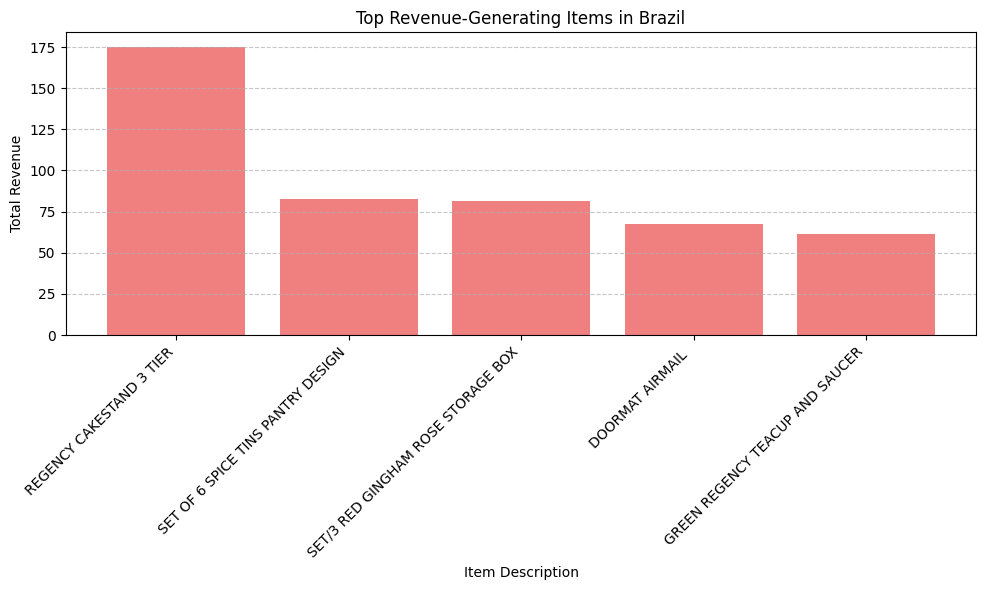

...

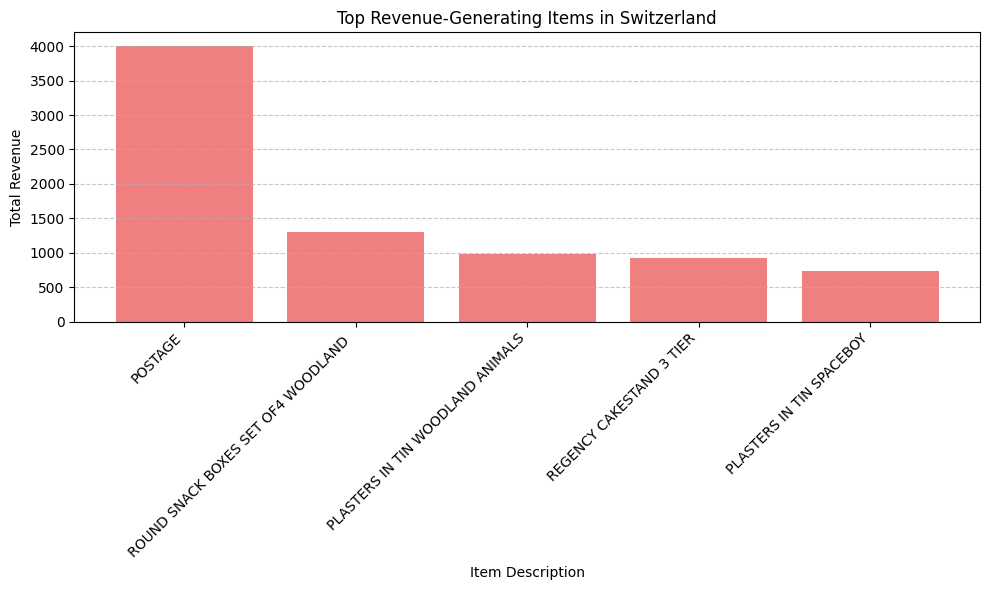

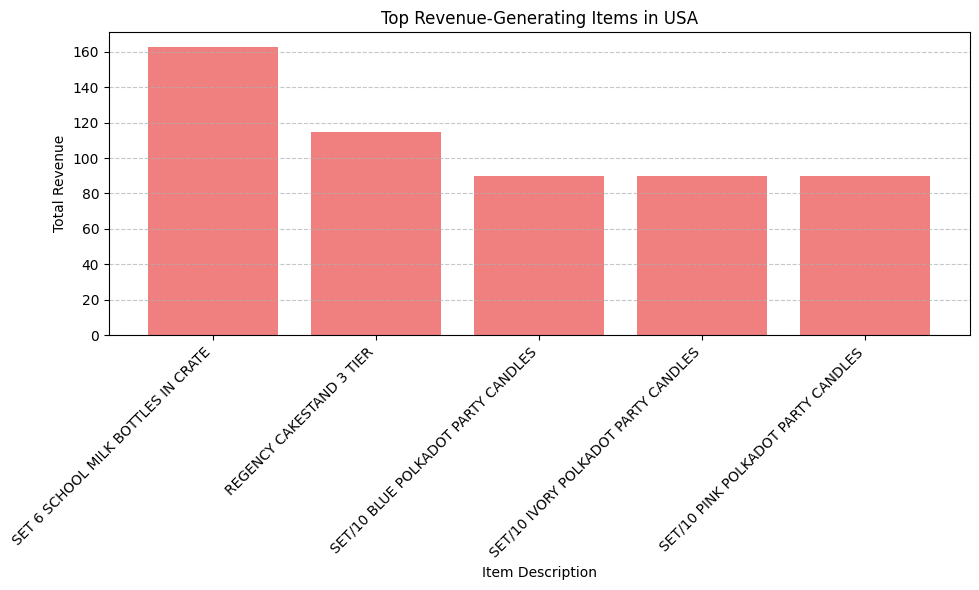

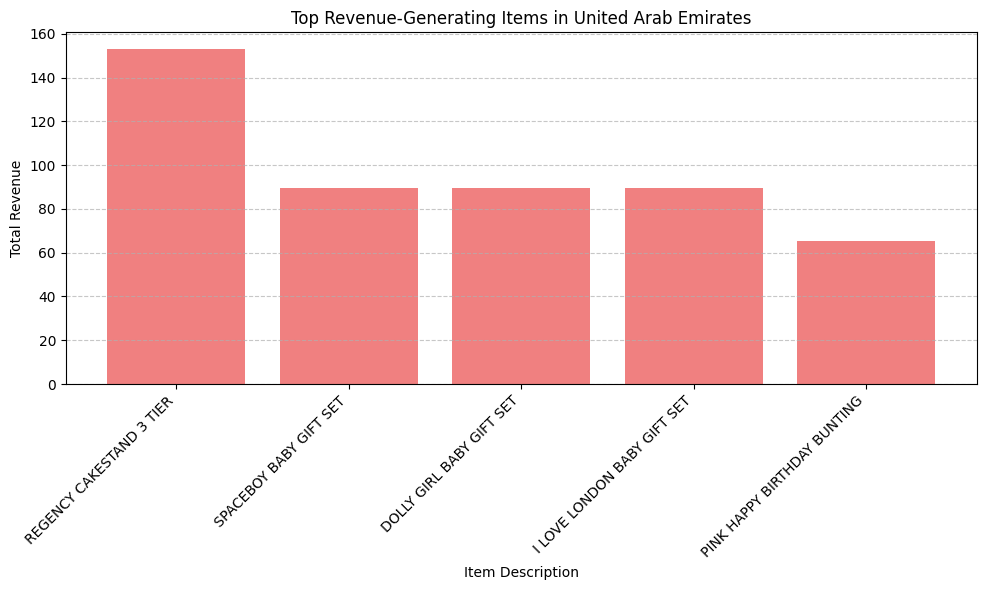

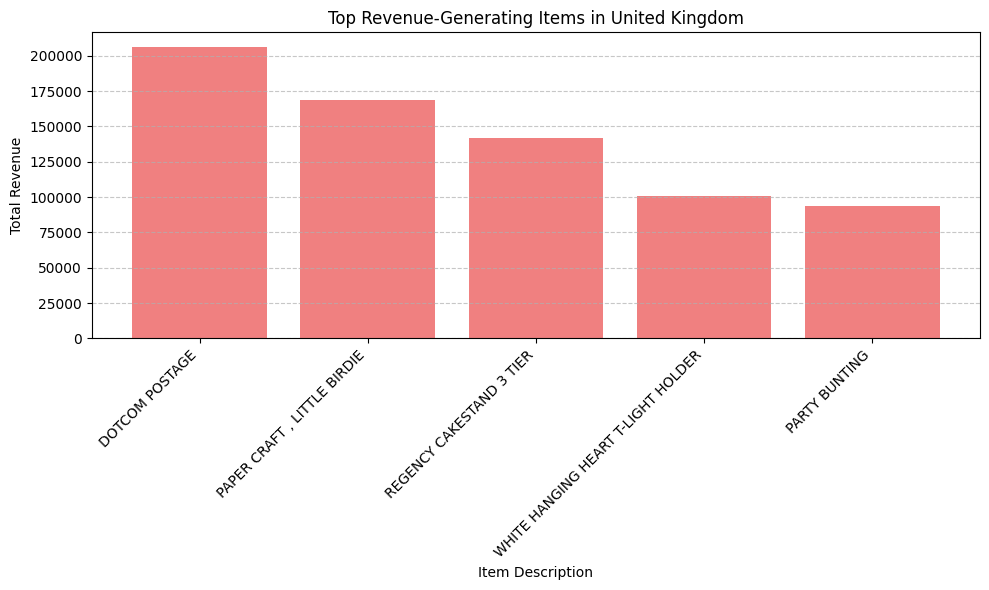

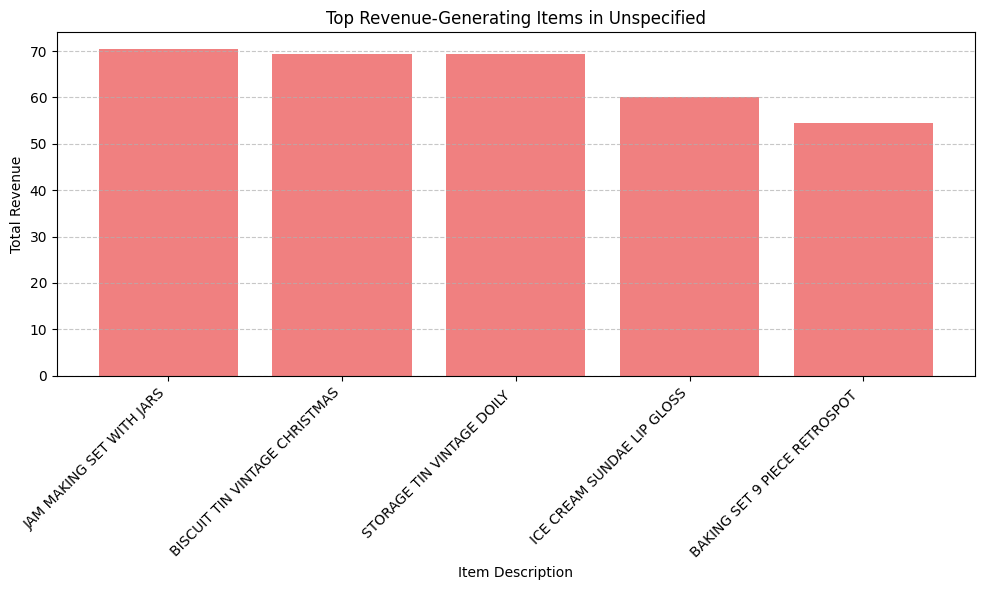

In [ ]:
# Group data (Country, Description, and sum of revenue)
top_items = data1.groupby(['Country', 'Description'])['Revenue'].sum()

# Sort in descending order
top_items = top_items.groupby(level=0, group_keys=False).nlargest(5)


top_items = top_items.reset_index(name='Total Revenue')

countries = top_items['Country'].unique()


for country in countries:
    country_data = top_items[top_items['Country'] == country]


    plt.figure(figsize=(10, 6))
    plt.bar(country_data['Description'], country_data['Total Revenue'], color='lightcoral')
    plt.title(f'Top Revenue-Generating Items in {country}')
    plt.xlabel('Item Description')
    plt.ylabel('Total Revenue')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


These were the topselling Items by each country.

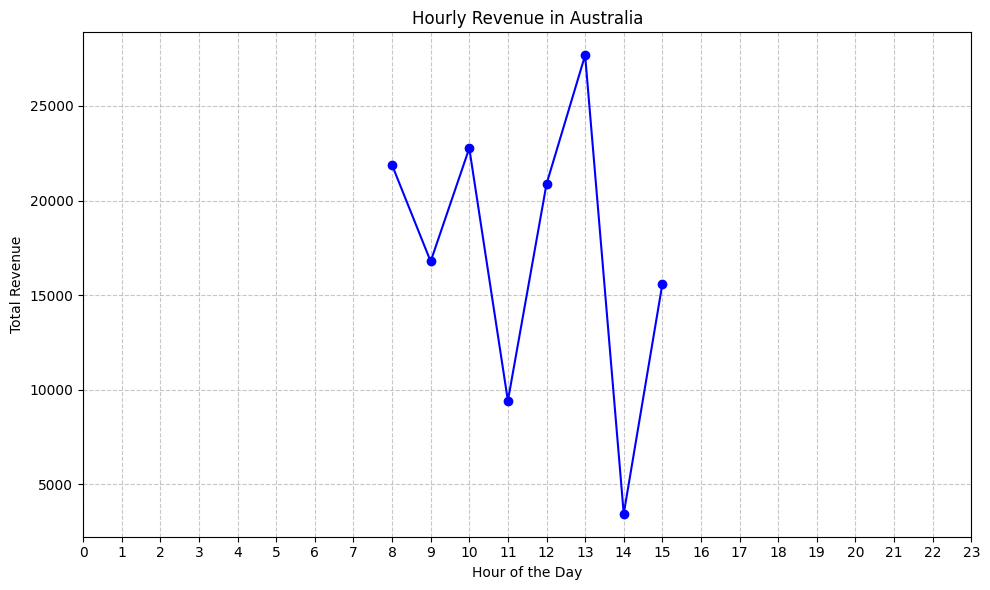

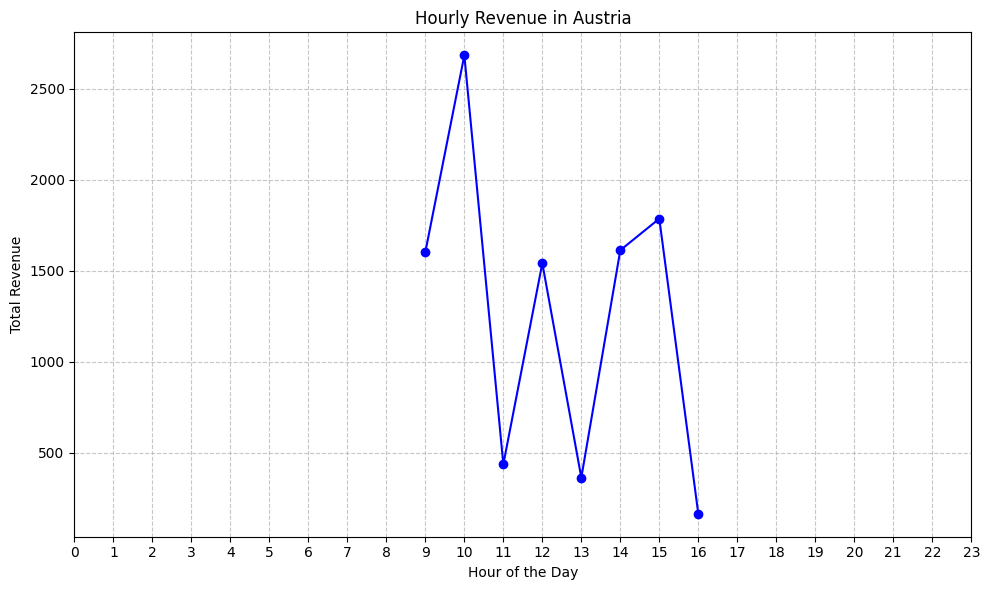

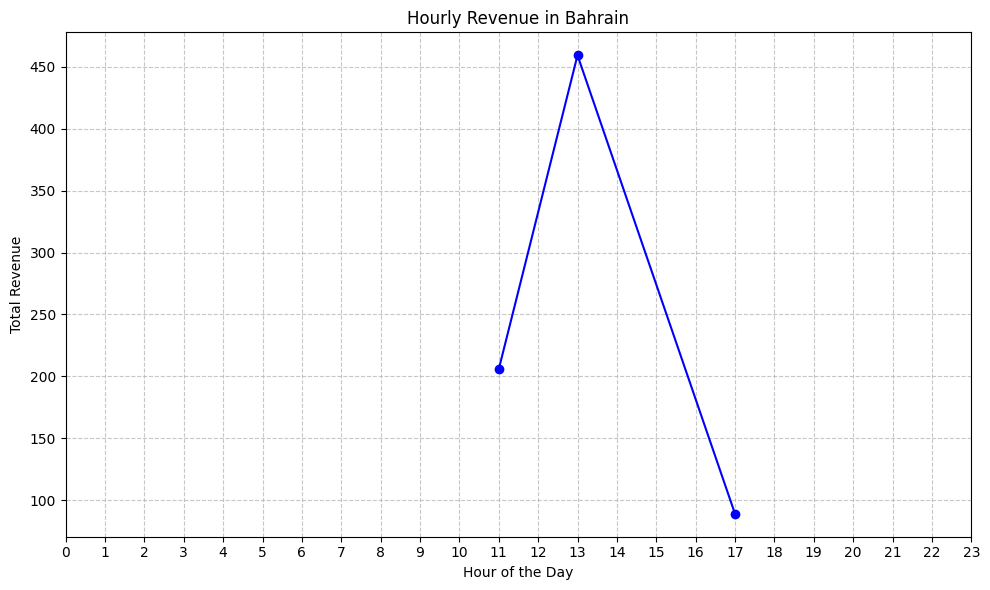

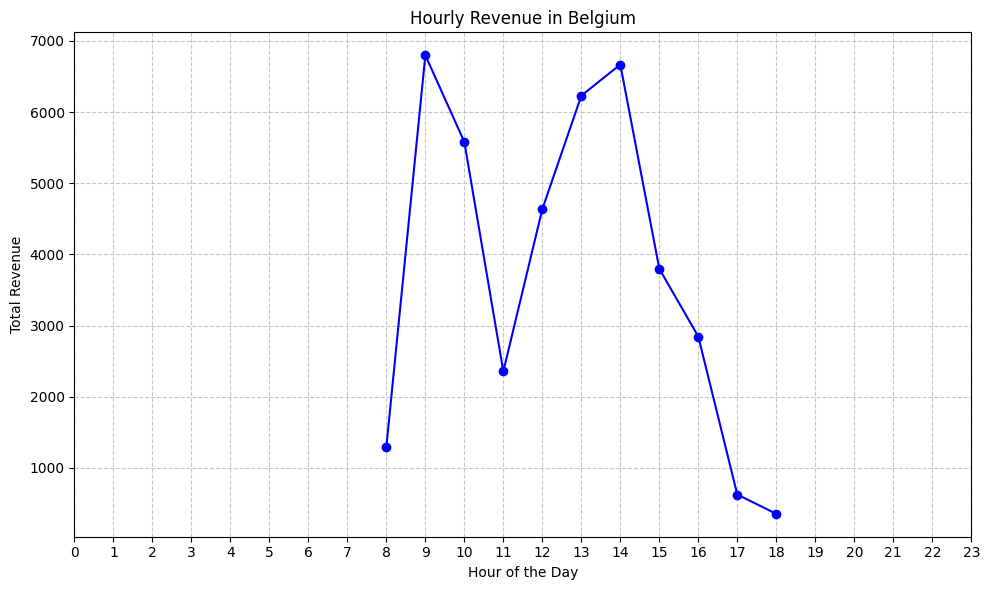

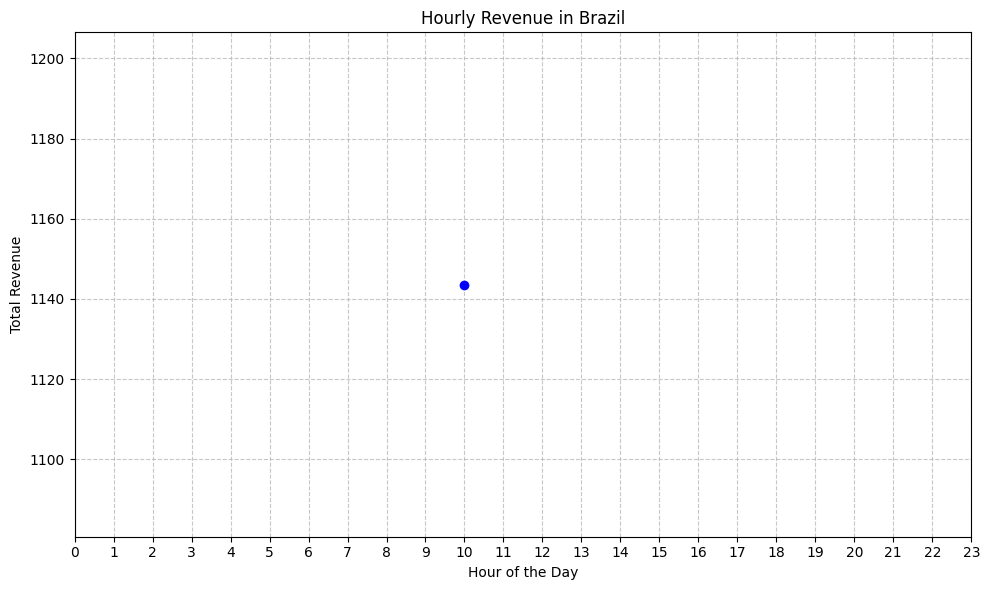

...

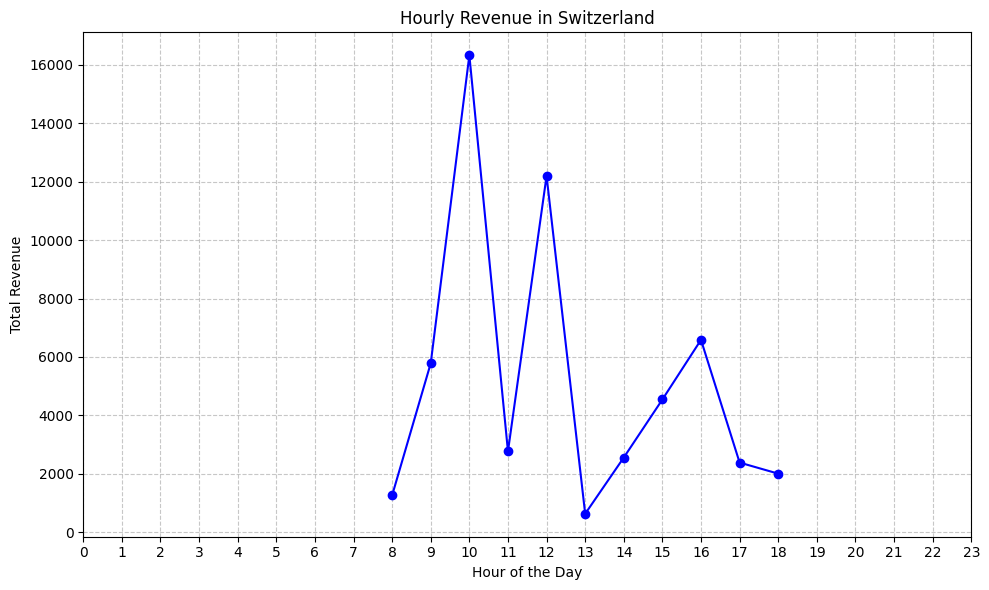

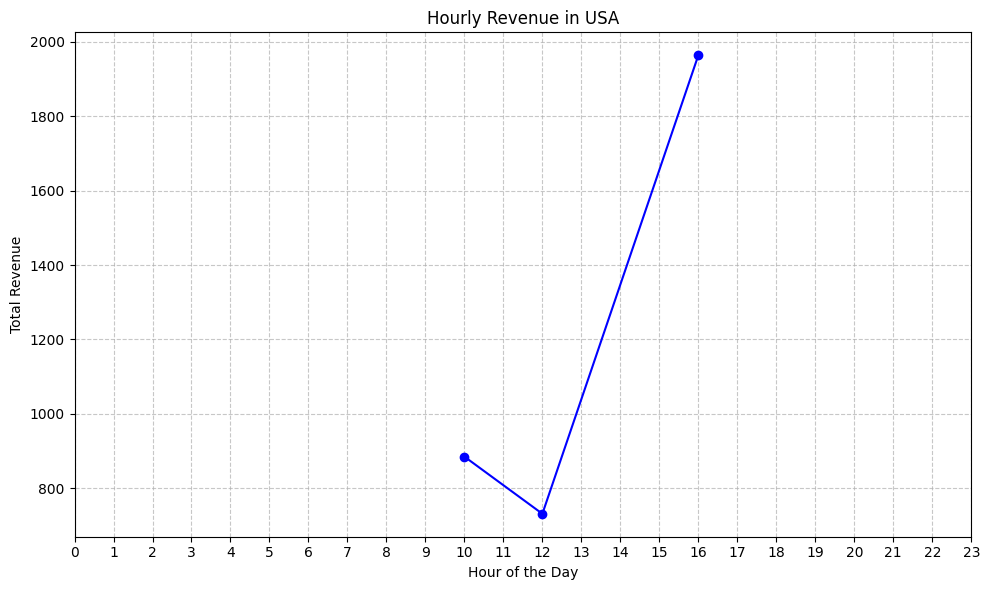

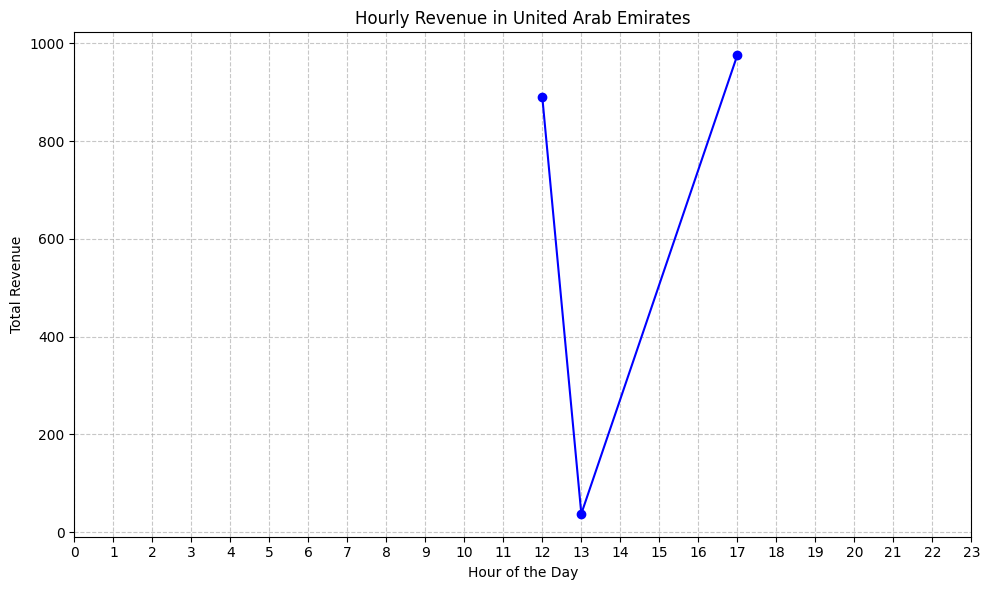

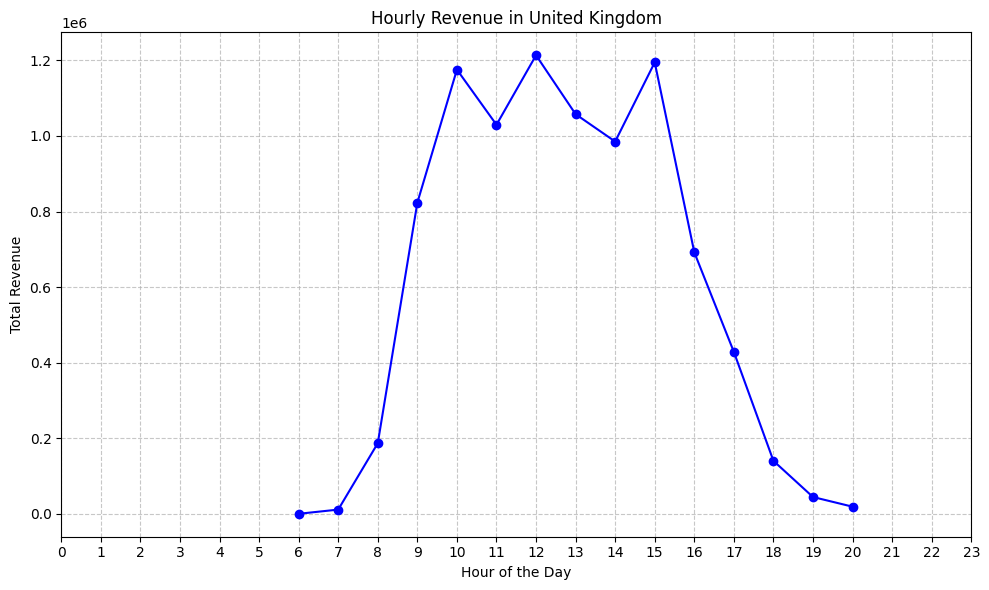

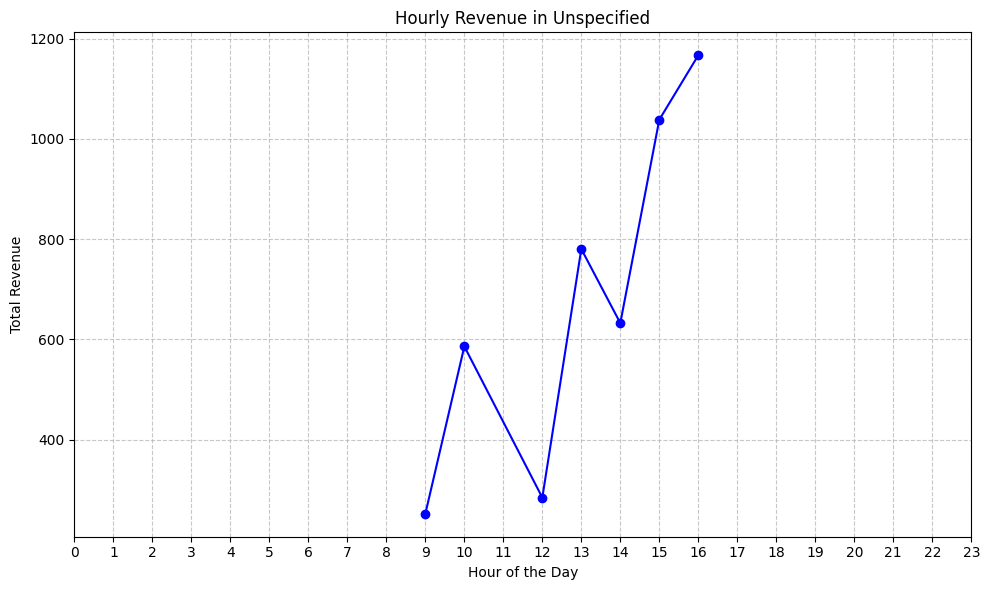

In [ ]:
data1['Hour'] = data1['InvoiceDate'].dt.hour

# Group (country and Hour, and sum of Revenue)
hourly_revenue = data1.groupby(['Country', 'Hour'])['Revenue'].sum().reset_index()

countries = hourly_revenue['Country'].unique()

for country in countries:
    country_data = hourly_revenue[hourly_revenue['Country'] == country]

    plt.figure(figsize=(10, 6))
    plt.plot(country_data['Hour'], country_data['Revenue'], marker='o', color='b')
    plt.title(f'Hourly Revenue in {country}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Total Revenue')
    plt.xticks(ticks=range(0, 24), labels=range(0, 24))
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


Insight- Different countries have different high revenue times but it generally lies around 11:00 am to 1:00 pm.

Question - Sir should we remove the countries that have just a dot as revenue?  but it would affect the overall sales, but dot indicates just a single purchase.

Using these graphs we can see the time where most revenue is generated.

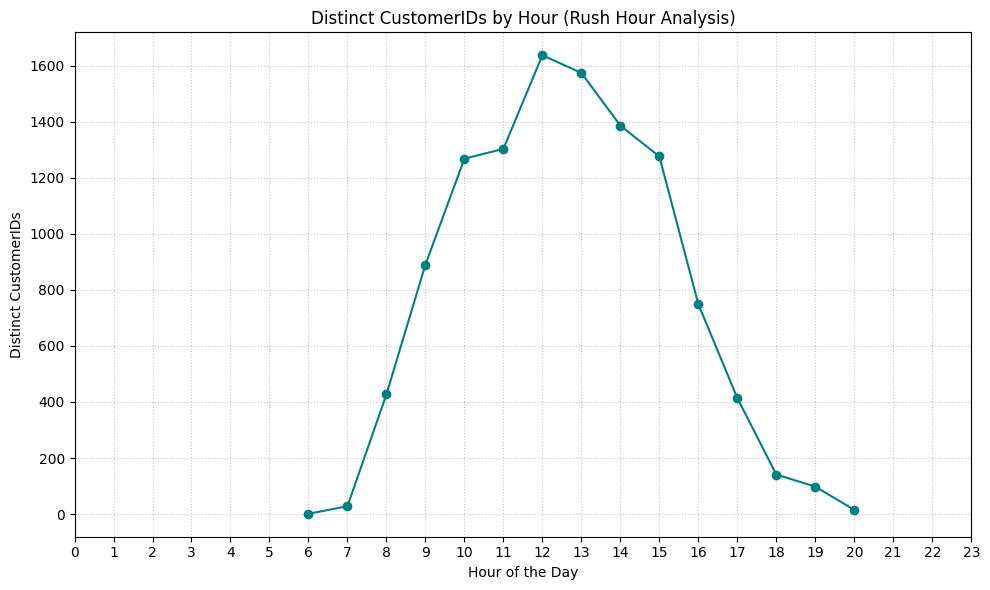

In [ ]:
data1['Hour'] = data1['InvoiceDate'].dt.hour

customer_count_per_hour = data1.groupby('Hour')['CustomerID'].nunique().reset_index(name='Distinct Customers')

plt.figure(figsize=(10, 6))
plt.plot(customer_count_per_hour['Hour'], customer_count_per_hour['Distinct Customers'], marker='o', color='teal')
plt.title('Distinct CustomerIDs by Hour (Rush Hour Analysis)')
plt.xlabel('Hour of the Day')
plt.ylabel('Distinct CustomerIDs')
plt.xticks(ticks=range(0, 24), labels=range(0, 24))
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()


Insight- Rush hour if taken average is around 10:00 am to 3:00 pm  and the peak is at noon.

We have used customer id's to see how many different customers are buying good and at what hour and then calculated rush hour based on the given data.

In [ ]:
data2 = data.copy()



*   We are deriving a new column "Return" in the new dataset. The negative Quantity prices indicate a return.  
*   Also we are creating a new dataset since we cannot edit the data1 dataset.





In [ ]:
data2 = data2.drop_duplicates()

In [ ]:
data2 = data2[data2['Quantity'] < 0]
data2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,01-12-2010 09:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,01-12-2010 09:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,01-12-2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,01-12-2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,01-12-2010 10:24,0.29,17548.0,United Kingdom


In [ ]:
total_rows_quantity = data2['Quantity'].count()
print("Total number of rows in 'Quantity' column:", total_rows_quantity)

Total number of rows in 'Quantity' column: 10587




*   We are dropping all the positive values of quantity for creating return.
*   Also we are removing rows in Unitprice that is equal to zero since there is no description given.



In [ ]:
rows_before = len(data2)
data2 = data2[~((data2['Quantity'] < 0) & (data2['UnitPrice'] == 0))]
rows_after = len(data2)

print(f"Number of rows before dropping: {rows_before}")
print(f"Number of rows after dropping: {rows_after}")

print(data2.head())

Number of rows before dropping: 10587
Number of rows after dropping: 9251
    InvoiceNo StockCode                       Description  Quantity  \
141   C536379         D                          Discount        -1   
154   C536383    35004C   SET OF 3 COLOURED  FLYING DUCKS        -1   
235   C536391     22556    PLASTERS IN TIN CIRCUS PARADE        -12   
236   C536391     21984  PACK OF 12 PINK PAISLEY TISSUES        -24   
237   C536391     21983  PACK OF 12 BLUE PAISLEY TISSUES        -24   

          InvoiceDate  UnitPrice  CustomerID         Country  
141  01-12-2010 09:41      27.50     14527.0  United Kingdom  
154  01-12-2010 09:49       4.65     15311.0  United Kingdom  
235  01-12-2010 10:24       1.65     17548.0  United Kingdom  
236  01-12-2010 10:24       0.29     17548.0  United Kingdom  
237  01-12-2010 10:24       0.29     17548.0  United Kingdom  


PAPER CRAFT , LITTLE BIRDIE (23843)            80995
MEDIUM CERAMIC TOP STORAGE JAR (23166)         74494
ROTATING SILVER ANGELS T-LIGHT HLDR (84347)     9376
Manual (M)                                      4066
FAIRY CAKE FLANNEL ASSORTED COLOUR (21108)      3150
WHITE HANGING HEART T-LIGHT HOLDER (85123A)     2578
GIN + TONIC DIET METAL SIGN (21175)             2030
HERB MARKER BASIL (22920)                       1527
FELTCRAFT DOLL MOLLY (22273)                    1447
TEA TIME PARTY BUNTING (47566B)                 1424
Name: Quantity, dtype: int64


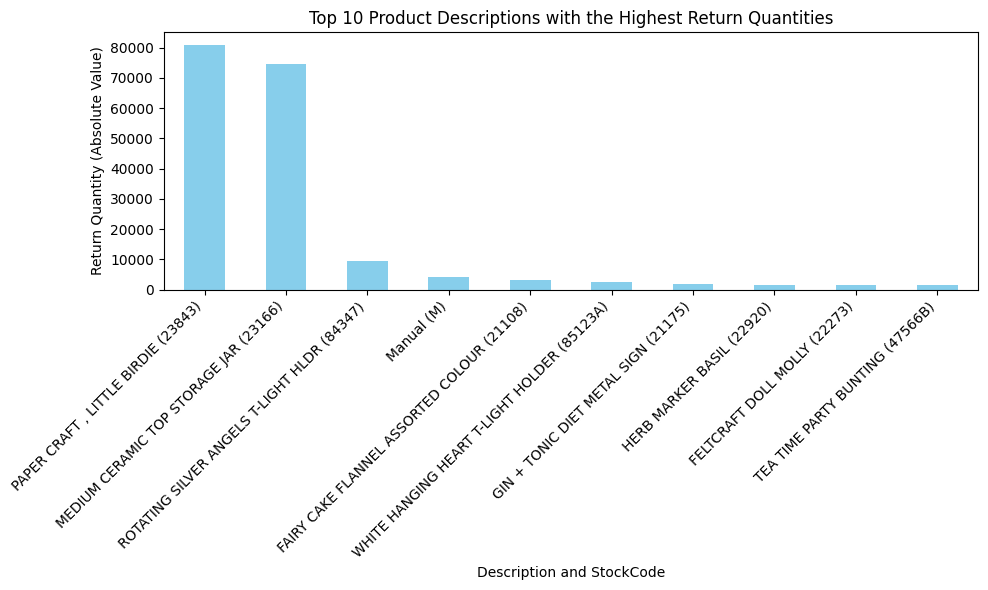

In [ ]:
return_quantity_by_description = data2.groupby(['Description', 'StockCode'])['Quantity'].sum().abs()
return_quantity_by_description = return_quantity_by_description.sort_values(ascending=False)
top_10_return_quantity = return_quantity_by_description.head(10)
top_10_return_quantity.index = [f"{desc} ({stockcode})" for desc, stockcode in top_10_return_quantity.index]
print(top_10_return_quantity)

plt.figure(figsize=(10, 6))
top_10_return_quantity.plot(kind='bar', color='skyblue')
plt.title('Top 10 Product Descriptions with the Highest Return Quantities')
plt.ylabel('Return Quantity (Absolute Value)')
plt.xlabel('Description and StockCode')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Here we have calculated the returns.



Insights:

*   We can find the top items that are being returned.
*   Then we can analyse if there is a defect in the product or not.



In [ ]:
data3 = data.copy()

In [ ]:
data3 = data3.drop_duplicates()

<ipython-input-102-b9b3c51830dc>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  returns['ReturnTime'] = (returns['InvoiceDate'] - returns['InvoiceDate'].shift(1)).dt.total_seconds() / 60


Return Times (in minutes) for Product: MEDIUM CERAMIC TOP STORAGE JAR
               InvoiceDate  ReturnTime
203625 2011-05-24 17:25:00    181868.0
234364 2011-06-20 16:13:00     38808.0
270084 2011-07-19 12:26:00     41533.0
290357 2011-08-04 14:46:00     23180.0
297530 2011-08-11 10:10:00      9804.0
349848 2011-09-21 09:50:00     59020.0
352712 2011-09-21 15:57:00       367.0
394002 2011-10-12 16:17:00     30260.0
421501 2011-10-27 10:56:00     21279.0

Average return time: 45124.33 minutes


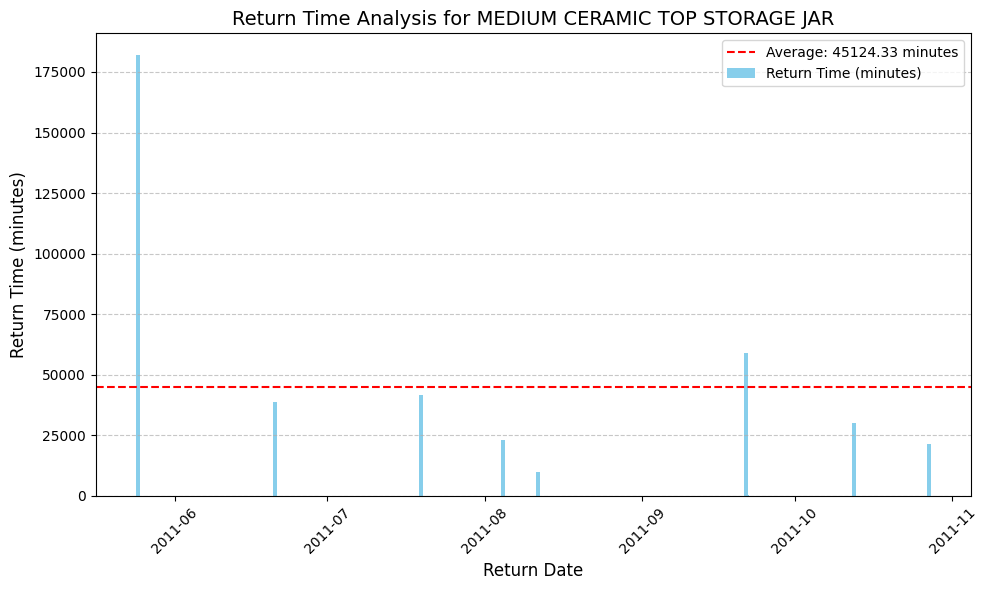

In [ ]:
data3['InvoiceDate'] = pd.to_datetime(data3['InvoiceDate'], format='%d-%m-%Y %H:%M', errors='coerce')
specific_product_data = data3[data3['Description'] == "MEDIUM CERAMIC TOP STORAGE JAR"]
returns = specific_product_data[specific_product_data['Quantity'] < 0]
returns['ReturnTime'] = (returns['InvoiceDate'] - returns['InvoiceDate'].shift(1)).dt.total_seconds() / 60
returns = returns.dropna()
average_return_time = returns['ReturnTime'].mean()

print("Return Times (in minutes) for Product: MEDIUM CERAMIC TOP STORAGE JAR")
print(returns[['InvoiceDate', 'ReturnTime']])
print(f"\nAverage return time: {average_return_time:.2f} minutes")

plt.figure(figsize=(10, 6))
plt.bar(returns['InvoiceDate'], returns['ReturnTime'], color='skyblue', label='Return Time (minutes)')
plt.axhline(y=average_return_time, color='r', linestyle='--', label=f'Average: {average_return_time:.2f} minutes')
plt.title("Return Time Analysis for MEDIUM CERAMIC TOP STORAGE JAR", fontsize=14)
plt.xlabel("Return Date", fontsize=12)
plt.ylabel("Return Time (minutes)", fontsize=12)
plt.legend()
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Here we have analyse the return of product "MEDIUM CERAMIC TOP STORAGE JAR" with stockcode: 23166.

In [ ]:
data3['InvoiceDate'] = pd.to_datetime(data3['InvoiceDate'], format='%d-%m-%Y %H:%M', errors='coerce')
product_code = '23166'
filtered_data = data3[data3['StockCode'] == product_code]
returns = filtered_data[filtered_data['Quantity'] < 0]
purchases = filtered_data[filtered_data['Quantity'] > 0]
merged_data = pd.merge(returns, purchases, on=['CustomerID', 'StockCode'], suffixes=('_return', '_purchase'))
merged_data['TimeDifference_minutes'] = (merged_data['InvoiceDate_return'] - merged_data['InvoiceDate_purchase']).dt.total_seconds() / 60

print(merged_data[['CustomerID', 'StockCode', 'InvoiceDate_purchase', 'InvoiceDate_return', 'TimeDifference_minutes']])


    CustomerID StockCode InvoiceDate_purchase  InvoiceDate_return  \
0      12346.0     23166  2011-01-18 10:01:00 2011-01-18 10:17:00   
1      15251.0     23166  2011-05-13 10:14:00 2011-05-24 17:25:00   
2      16684.0     23166  2011-05-18 10:47:00 2011-06-20 16:13:00   
3      16684.0     23166  2011-07-24 13:11:00 2011-06-20 16:13:00   
4      16684.0     23166  2011-12-05 14:06:00 2011-06-20 16:13:00   
5      12415.0     23166  2011-06-15 13:37:00 2011-07-19 12:26:00   
6      12415.0     23166  2011-07-19 10:51:00 2011-07-19 12:26:00   
7      12415.0     23166  2011-08-18 08:51:00 2011-07-19 12:26:00   
8      14911.0     23166  2011-06-22 11:46:00 2011-08-04 14:46:00   
9      14911.0     23166  2011-07-21 18:19:00 2011-08-04 14:46:00   
10     14911.0     23166  2011-07-28 14:27:00 2011-08-04 14:46:00   
11     14911.0     23166  2011-07-28 15:16:00 2011-08-04 14:46:00   
12     14911.0     23166  2011-08-04 14:40:00 2011-08-04 14:46:00   
13     14911.0     23166  2011-11-

Question- Sir I have been trying to figure out what negative time means, I think these are about the customer returning the items that were purchased but not recorded, so should we remove those?


In [ ]:
data3['InvoiceDate'] = pd.to_datetime(data3['InvoiceDate'], format='%d-%m-%Y %H:%M', errors='coerce')
product_code = '23843'
filtered_data = data3[data3['StockCode'] == product_code]
returns = filtered_data[filtered_data['Quantity'] < 0]
purchases = filtered_data[filtered_data['Quantity'] > 0]
merged_data = pd.merge(returns, purchases, on=['CustomerID', 'StockCode'], suffixes=('_return', '_purchase'))
merged_data['TimeDifference_minutes'] = (merged_data['InvoiceDate_return'] - merged_data['InvoiceDate_purchase']).dt.total_seconds() / 60
print(merged_data[['CustomerID', 'StockCode', 'InvoiceDate_purchase', 'InvoiceDate_return', 'TimeDifference_minutes']])


   CustomerID StockCode InvoiceDate_purchase  InvoiceDate_return  \
0     16446.0     23843  2011-12-09 09:15:00 2011-12-09 09:27:00   

   TimeDifference_minutes  
0                    12.0  


Insight- The product "PAPER CRAFT , LITTLE BIRDIE" with stock code: 23843 for quantity  80995 was purchased by a single user and returned within 12 minutes. That prompted us to find how many diffrent customer id's are related to stock code.

Question- sir can we remove this product because if we do the sales changes dramatically.


Sorted Product Frequency (Highest to Lowest Unique Customer Count):
     StockCode                          Description  UniqueCustomerCount
1554     22423             REGENCY CAKESTAND 3 TIER                  887
4223    85123A   WHITE HANGING HEART T-LIGHT HOLDER                  858
3295     47566                        PARTY BUNTING                  708
3956     84879        ASSORTED COLOUR BIRD ORNAMENT                  679
1890     22720    SET OF 3 CAKE TINS PANTRY DESIGN                   640
...        ...                                  ...                  ...
3190    37479P                sold as set on dotcom                    0
3188    37479P                                   ??                    0
3187    37479B                sold as set by dotcom                    0
3183     37474  SET/4 2 TONE EGG SHAPE MIXING BOWLS                    0
4791         m                               Manual                    0

[4792 rows x 3 columns]


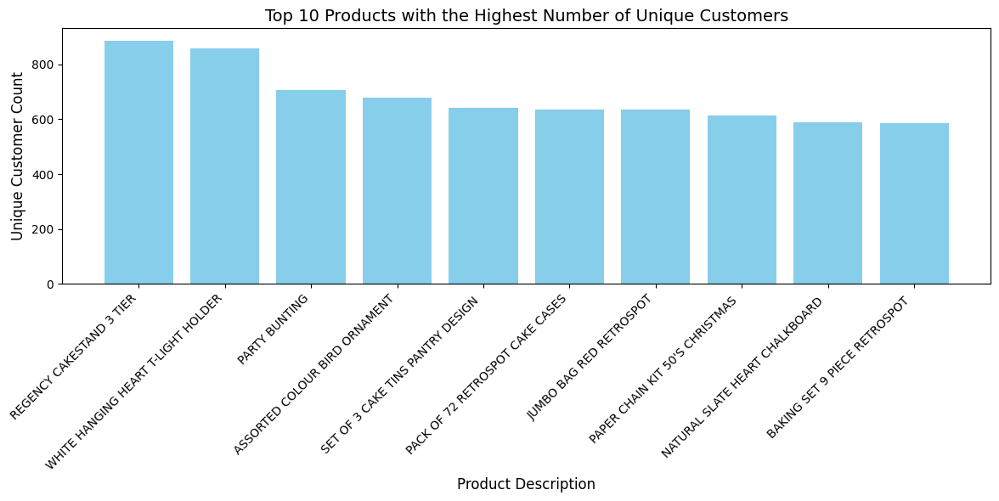

In [ ]:
product_frequency = data3.groupby(['StockCode', 'Description'])['CustomerID'].nunique().reset_index()
product_frequency.columns = ['StockCode', 'Description', 'UniqueCustomerCount']
sorted_product_frequency = product_frequency.sort_values(by='UniqueCustomerCount', ascending=False)
print("\nSorted Product Frequency (Highest to Lowest Unique Customer Count):")
print(sorted_product_frequency)
plt.figure(figsize=(12, 6))

top_10_products = sorted_product_frequency.head(10)
plt.bar(top_10_products['Description'], top_10_products['UniqueCustomerCount'], color='skyblue')

plt.title("Top 10 Products with the Highest Number of Unique Customers", fontsize=14)
plt.xlabel("Product Description", fontsize=12)
plt.ylabel("Unique Customer Count", fontsize=12)

plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


Insight

*   Here we have seen which product is famous among customers by finding unique customer id's related to the stock code.
*   The top product in that category is "REGENCY CAKESTAND 3 TIER".

*   We can use this opportunity to increase the prices to increase the revenue or give discounts to attract customers so we can increase the customer base.









Sorted Products by Fastest Return Times (Shortest to Longest):
     StockCode                          Description  AvgReturnTime_minutes
1015     22930    BAKING MOULD HEART MILK CHOCOLATE                2.00000
287      21633         SUNFLOWER DECORATIVE PARASOL                2.00000
1481    47566B  incorrectly credited C550456 see 47                2.00000
1016     22932    BAKING MOULD TOFFEE CUP CHOCOLATE                2.00000
852      22689         DOORMAT MERRY CHRISTMAS RED                 3.00000
...        ...                                  ...                    ...
808      22632            HAND WARMER RED RETROSPOT           335408.47619
283      21624          VINTAGE UNION JACK DOORSTOP           342442.00000
734      22515             CHILDS GARDEN SPADE PINK           367071.00000
413      21981         PACK OF 12 WOODLAND TISSUES            460947.00000
644      22378                 WALL TIDY RETROSPOT            499940.00000

[1827 rows x 3 columns]


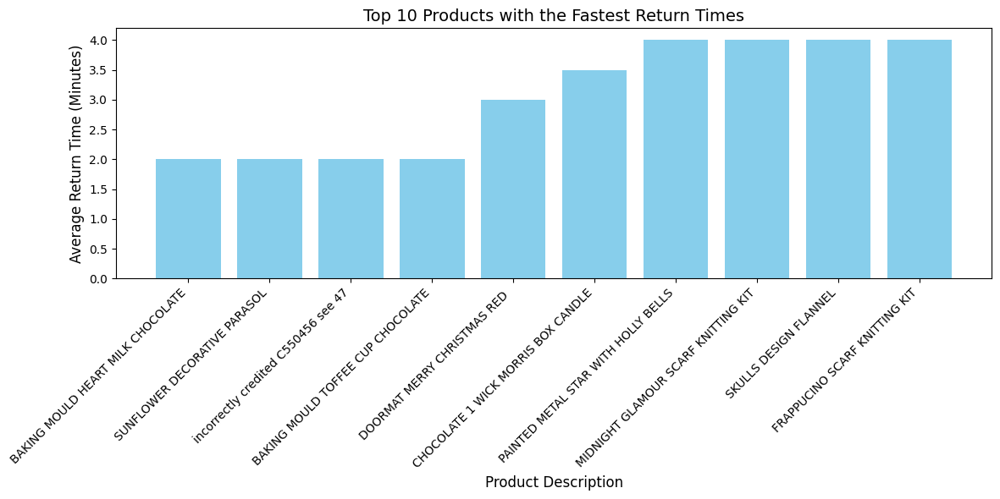

In [ ]:
data3['InvoiceDate'] = pd.to_datetime(data3['InvoiceDate'], format='%d-%m-%Y %H:%M', errors='coerce')
returns = data3[data3['Quantity'] < 0]
purchases = data3[data3['Quantity'] > 0]
merged_data = pd.merge(returns, purchases, on=['CustomerID', 'StockCode', 'Description'], suffixes=('_return', '_purchase'))
merged_data['TimeDifference_minutes'] = (merged_data['InvoiceDate_return'] - merged_data['InvoiceDate_purchase']).dt.total_seconds() / 60
merged_data = merged_data[merged_data['TimeDifference_minutes'] >= 0]
average_return_time = merged_data.groupby(['StockCode', 'Description'])['TimeDifference_minutes'].mean().reset_index()
average_return_time.columns = ['StockCode', 'Description', 'AvgReturnTime_minutes']
sorted_average_return_time = average_return_time.sort_values(by='AvgReturnTime_minutes', ascending=True)

print("\nSorted Products by Fastest Return Times (Shortest to Longest):")
print(sorted_average_return_time)

plt.figure(figsize=(12, 6))

top_10_fastest_returns = sorted_average_return_time.head(10)
plt.bar(top_10_fastest_returns['Description'], top_10_fastest_returns['AvgReturnTime_minutes'], color='skyblue')

plt.title("Top 10 Products with the Fastest Return Times", fontsize=14)
plt.xlabel("Product Description", fontsize=12)
plt.ylabel("Average Return Time (Minutes)", fontsize=12)

plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


Insight- We can see via above graph the products that are returned the fastest and can analyse if the product are defective or the reason it is being returned.

<ipython-input-107-3ad1f65cb9b1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  returns['ReturnTime'] = (returns['InvoiceDate'] - returns['InvoiceDate'].shift(1)).dt.total_seconds() / 60


Return Times (in minutes):
               InvoiceDate  ReturnTime
154    2010-12-01 09:49:00         8.0
235    2010-12-01 10:24:00        35.0
236    2010-12-01 10:24:00         0.0
237    2010-12-01 10:24:00         0.0
238    2010-12-01 10:24:00         0.0
...                    ...         ...
540449 2011-12-09 09:57:00         0.0
541541 2011-12-09 10:28:00        31.0
541715 2011-12-09 11:57:00        89.0
541716 2011-12-09 11:58:00         1.0
541717 2011-12-09 11:58:00         0.0

[8871 rows x 2 columns]

Average return time: 49.84 minutes


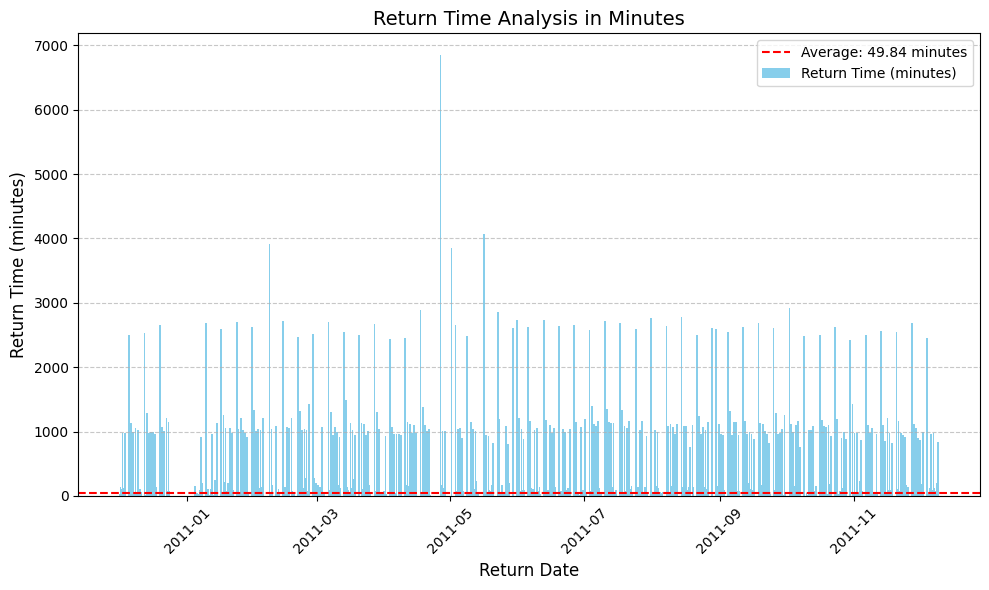

In [ ]:
data3['InvoiceDate'] = pd.to_datetime(data3['InvoiceDate'], format='%d-%m-%Y %H:%M', errors='coerce')
returns = data3[data3['Quantity'] < 0]
returns['ReturnTime'] = (returns['InvoiceDate'] - returns['InvoiceDate'].shift(1)).dt.total_seconds() / 60
returns = returns.dropna()
average_return_time = returns['ReturnTime'].mean()
print("Return Times (in minutes):")
print(returns[['InvoiceDate', 'ReturnTime']])
print(f"\nAverage return time: {average_return_time:.2f} minutes")

plt.figure(figsize=(10, 6))
plt.bar(returns['InvoiceDate'], returns['ReturnTime'], color='skyblue', label='Return Time (minutes)')
plt.axhline(y=average_return_time, color='r', linestyle='--', label=f'Average: {average_return_time:.2f} minutes')
plt.title("Return Time Analysis in Minutes", fontsize=14)
plt.xlabel("Return Date", fontsize=12)
plt.ylabel("Return Time (minutes)", fontsize=12)
plt.legend()
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Here we have analysed the average return time of all thye products.


Top 10 Best-Selling Products by Revenue (Overall):
Description
DOTCOM POSTAGE                        206248.77
REGENCY CAKESTAND 3 TIER              174156.54
PAPER CRAFT , LITTLE BIRDIE           168469.60
WHITE HANGING HEART T-LIGHT HOLDER    106236.72
PARTY BUNTING                          99445.23
JUMBO BAG RED RETROSPOT                94159.81
MEDIUM CERAMIC TOP STORAGE JAR         81700.92
POSTAGE                                78101.88
Manual                                 77752.82
RABBIT NIGHT LIGHT                     66870.03
Name: Revenue, dtype: float64


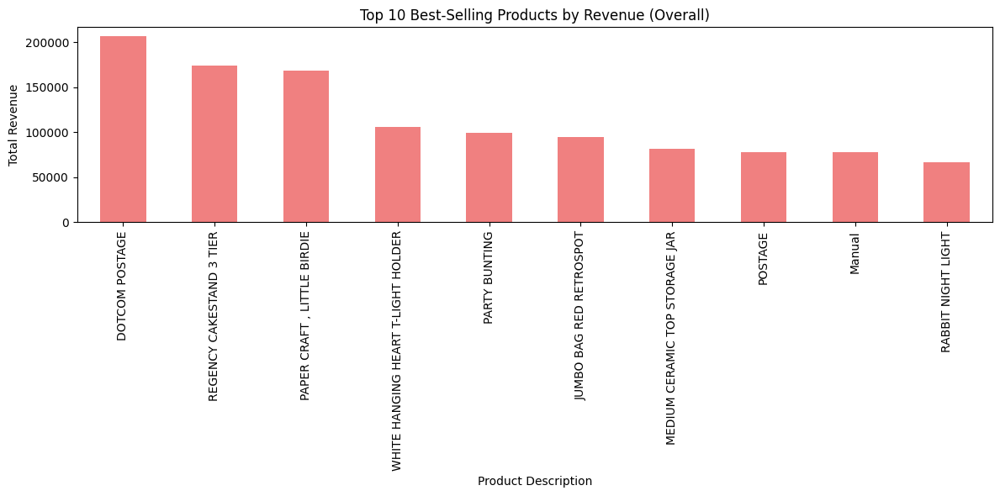

In [ ]:
best_selling_by_revenue = data1.groupby('Description')['Revenue'].sum().sort_values(ascending=False)

print(f"\nTop 10 Best-Selling Products by Revenue (Overall):")
print(best_selling_by_revenue.head(10))

plt.figure(figsize=(12, 6))
best_selling_by_revenue.head(10).plot(kind='bar', color='lightcoral')
plt.title('Top 10 Best-Selling Products by Revenue (Overall)')
plt.xlabel('Product Description')
plt.ylabel('Total Revenue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


We have to drop normalized quantity and unitprice.

            Quantity  UnitPrice  CustomerID   Revenue      Hour     Month  \
Quantity    1.000000  -0.003831   -0.006210  0.898783 -0.018536 -0.002358   
UnitPrice  -0.003831   1.000000   -0.010790  0.137396  0.004351  0.000382   
CustomerID -0.006210  -0.010790    1.000000 -0.003892  0.065788  0.029641   
Revenue     0.898783   0.137396   -0.003892  1.000000 -0.015688  0.000472   
Hour       -0.018536   0.004351    0.065788 -0.015688  1.000000  0.026919   
Month      -0.002358   0.000382    0.029641  0.000472  0.026919  1.000000   
DayOfWeek  -0.002392  -0.009686    0.019834 -0.004486 -0.033216  0.040745   

            DayOfWeek  
Quantity    -0.002392  
UnitPrice   -0.009686  
CustomerID   0.019834  
Revenue     -0.004486  
Hour        -0.033216  
Month        0.040745  
DayOfWeek    1.000000  


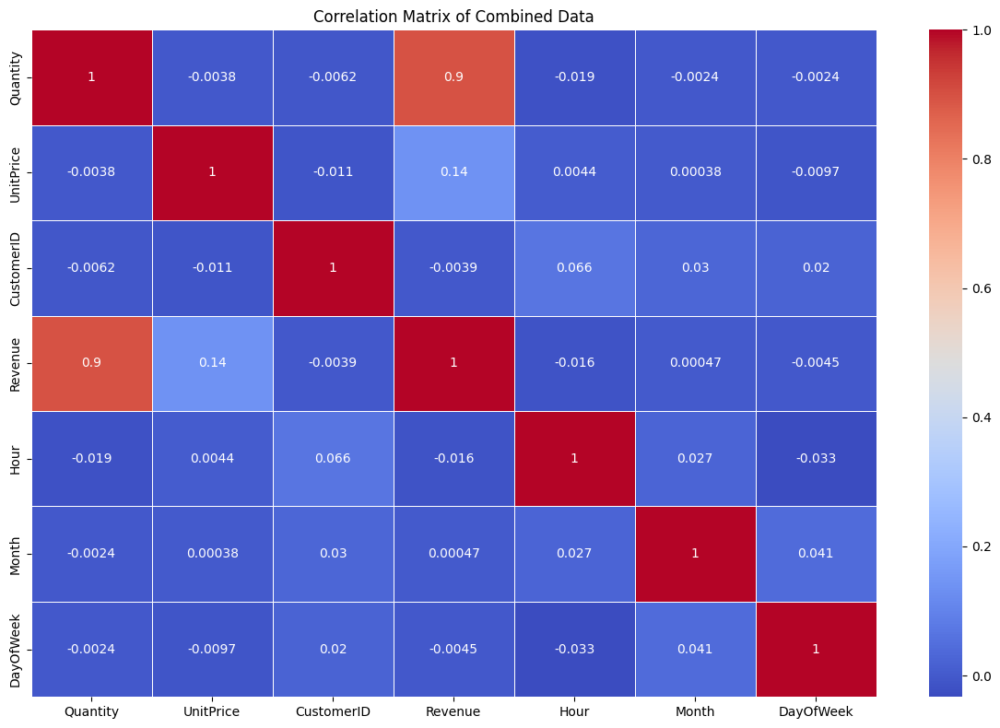

In [ ]:
combined_data = pd.concat([data1, data2, data3], axis=1)
numeric_data = combined_data.select_dtypes(include=['number']).drop(columns=[ 'UnitPrice_normalized', 'Quantity_normalized'])
numeric_data = numeric_data.loc[:, ~numeric_data.columns.duplicated()]

correlation_matrix = numeric_data.corr()
print(correlation_matrix)

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Combined Data')
plt.tight_layout()
plt.show()


In [ ]:
data1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Quantity_normalized,UnitPrice_normalized,Revenue,Hour,Month,DayOfWeek
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,0.000062,0.000188,15.30,8,12,2
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0.000062,0.000250,20.34,8,12,2
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,0.000086,0.000203,22.00,8,12,2
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0.000062,0.000250,20.34,8,12,2
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0.000062,0.000250,20.34,8,12,2


In [ ]:
data1.shape

(526052, 14)

Text(0.5, 1.0, 'Quantity Distribution (Positive vs Negative)')

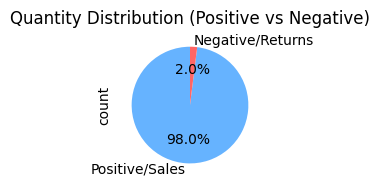

In [ ]:

plt.subplot(2, 3, 5)
quantity_category = data3['Quantity'].apply(lambda x: 'Positive/Sales' if x > 0 else 'Negative/Returns')
quantity_counts = quantity_category.value_counts()
quantity_counts.plot(kind='pie', autopct='%1.1f%%', colors=['#66b3ff', '#ff6666'], startangle=90, ax=plt.gca())
plt.title('Quantity Distribution (Positive vs Negative)')


Insight- From the above graph we can see that only 2% of the products are being returned.

In [ ]:
data3['Quantity_category'] = data3['Quantity'].apply(lambda x: 'Positive/Sales' if x > 0 else 'Negative/Returns')
countries = data3['Country'].unique()
num_countries = len(countries)
num_cols = 2
num_rows = (num_countries + num_cols - 1) // num_cols

plt.figure(figsize=(350, 200))

for i, country in enumerate(countries):
    plt.subplot(num_rows, num_cols, i + 1)
    country_data = data3[data3['Country'] == country]
    quantity_counts = country_data['Quantity_category'].value_counts()
    quantity_counts.plot(kind='pie', autopct='%1.1f%%', colors=['#66b3ff', '#ff6666'],
                         startangle=90, ax=plt.gca(), wedgeprops={'width': 0.4})
    plt.title(f'{country} Quantity Distribution')

plt.tight_layout()
plt.show()


Insights-

*   Based of the Return charts we can see what percentage of itemsare being returned.
*   We can see that the highest returns are being made in "USA" whereas the lowest or no returns are being made in "Brazil","UAE" etc.



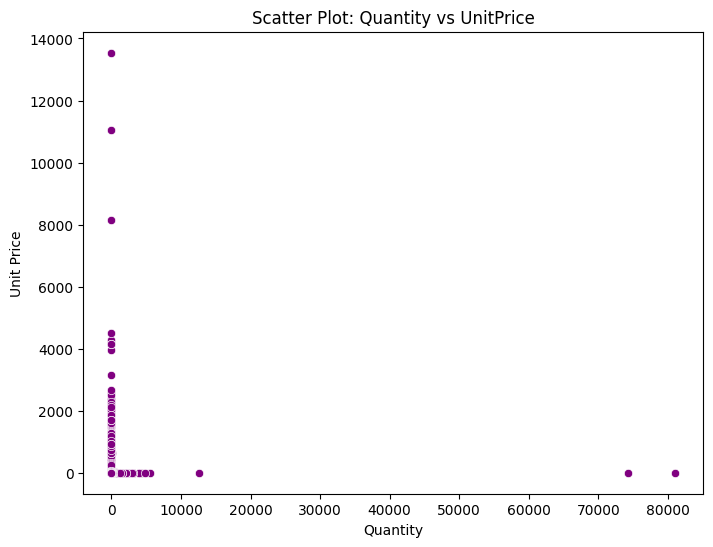

In [ ]:

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Quantity', y='UnitPrice', data=data1, color='purple')
plt.title('Scatter Plot: Quantity vs UnitPrice')
plt.xlabel('Quantity')
plt.ylabel('Unit Price')
plt.show()


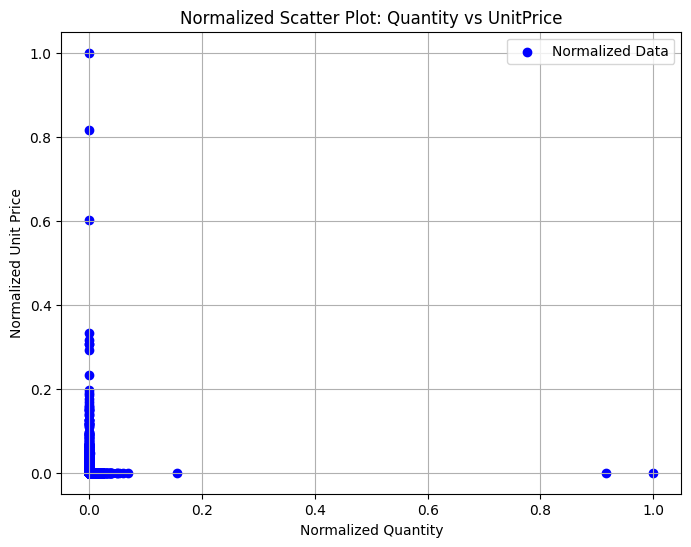

In [ ]:
scaler = MinMaxScaler()
normalized_data = data1[['Quantity', 'UnitPrice']]
normalized_data = scaler.fit_transform(normalized_data)

plt.figure(figsize=(8, 6))
plt.scatter(normalized_data[:, 0], normalized_data[:, 1], color='blue', label='Normalized Data')
plt.title('Normalized Scatter Plot: Quantity vs UnitPrice')
plt.xlabel('Normalized Quantity')
plt.ylabel('Normalized Unit Price')
plt.grid(True)
plt.legend()
plt.show()

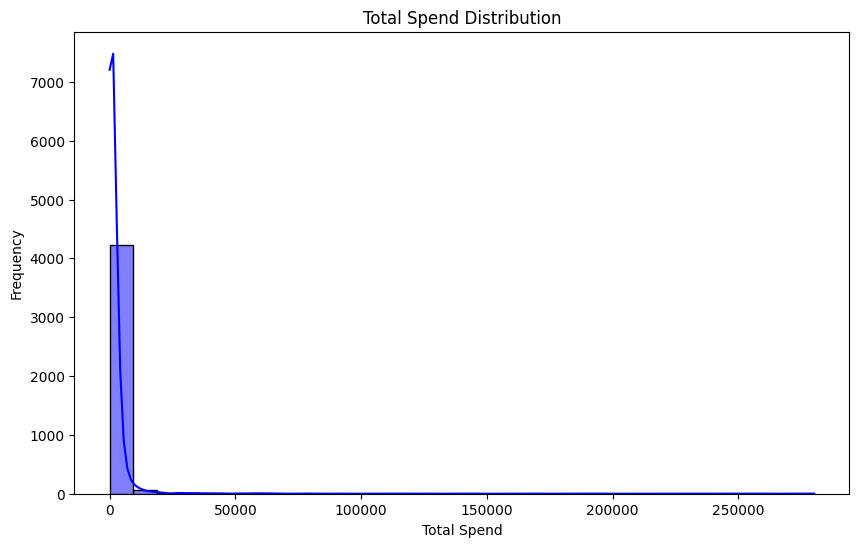

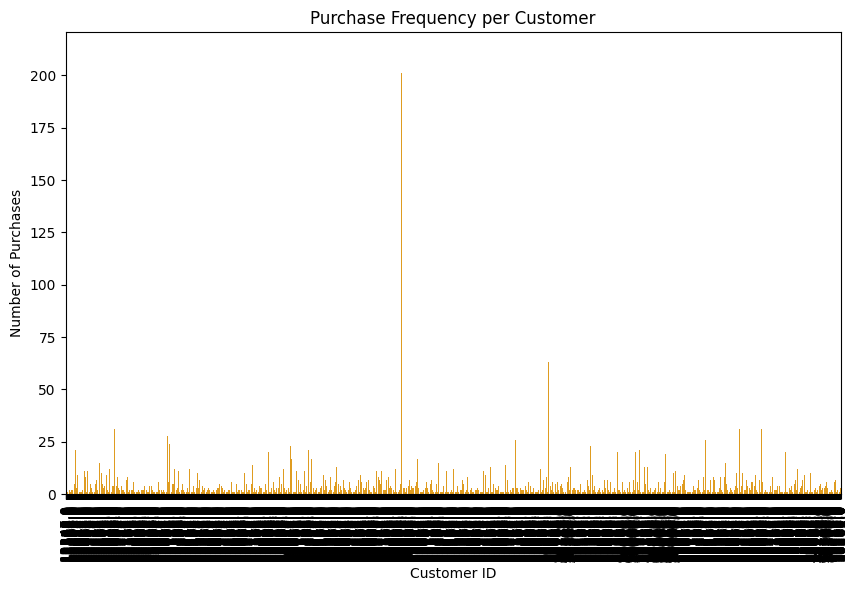

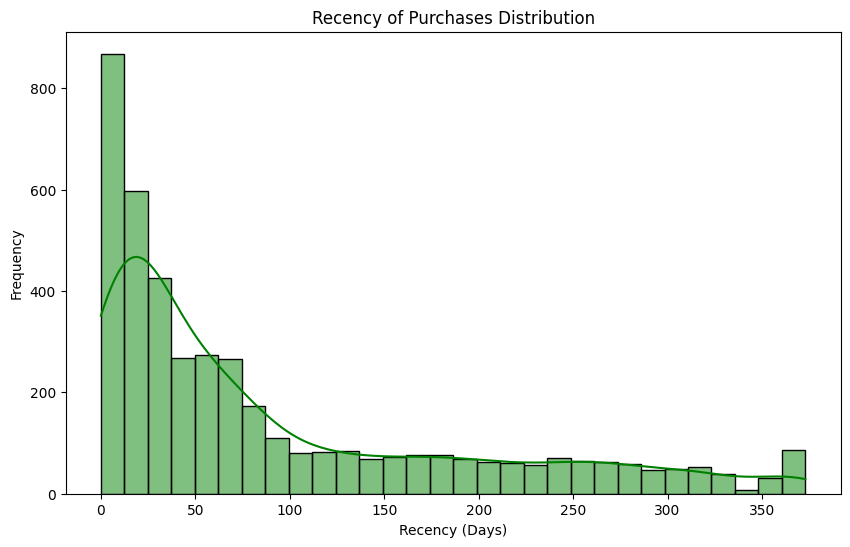

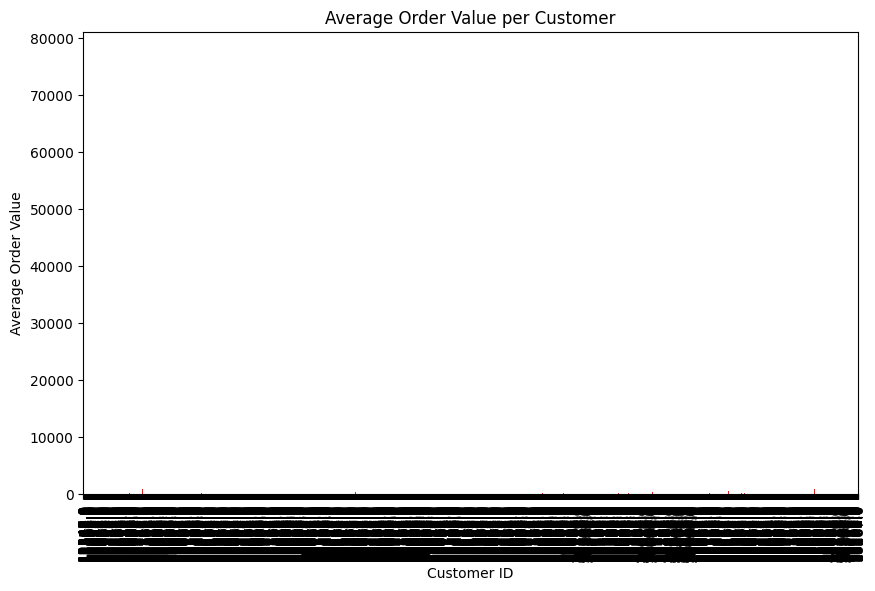

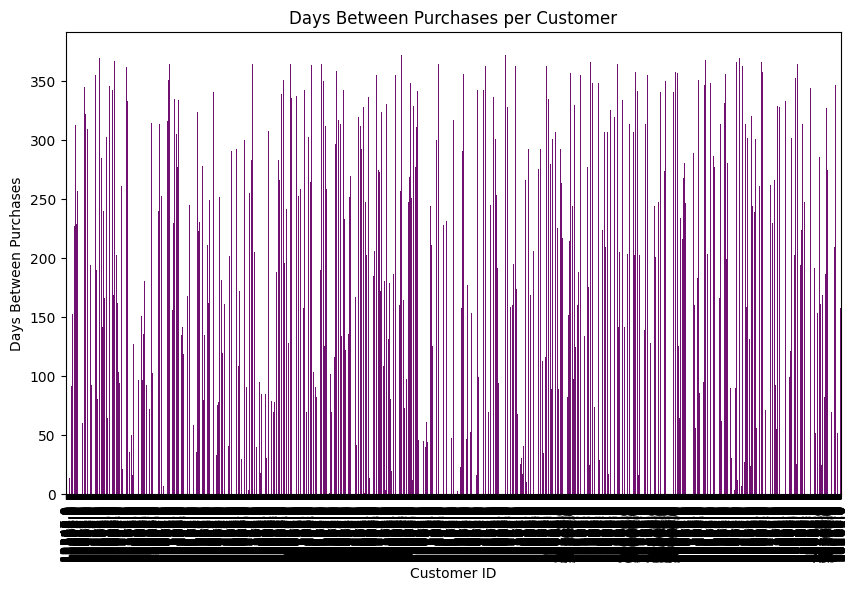

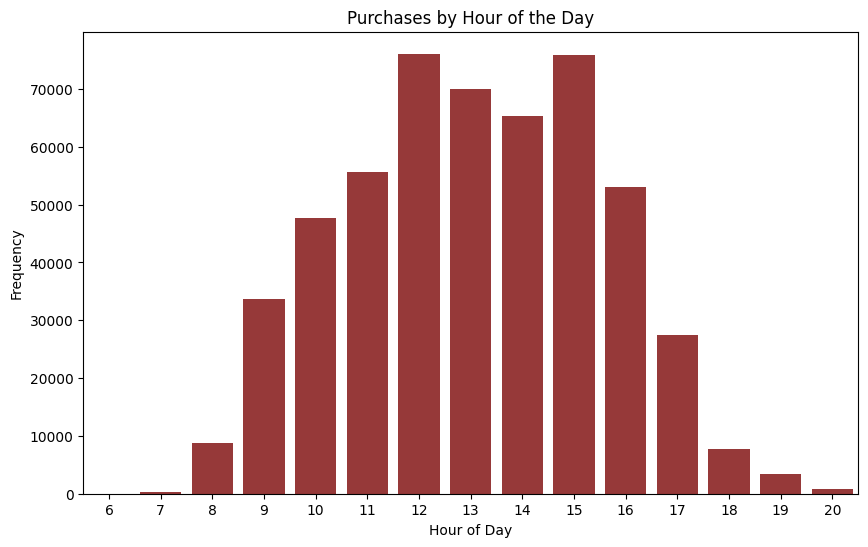

In [ ]:
#Total Spend per Customer
data1['TotalSpend'] = data1['Quantity'] * data1['UnitPrice']
customer_spend = data1.groupby('CustomerID')['TotalSpend'].sum().reset_index()

#Frequency of Purchases
customer_freq = data1.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()
customer_freq.rename(columns={'InvoiceNo': 'PurchaseFrequency'}, inplace=True)

#Recent of Purchases
data1['InvoiceDate'] = pd.to_datetime(data1['InvoiceDate'], format='%d-%m-%Y %H:%M')
recency = data1.groupby('CustomerID')['InvoiceDate'].max().reset_index()
recency['Recency'] = (data1['InvoiceDate'].max() - recency['InvoiceDate']).dt.days

#Average Order Value
customer_aov = data1.groupby('CustomerID')['TotalSpend'].mean().reset_index()
customer_aov.rename(columns={'TotalSpend': 'AvgOrderValue'}, inplace=True)

#Most Popular Products
product_count = data1.groupby(['CustomerID', 'StockCode'])['Quantity'].sum().reset_index()

#Time of Purchase
data1['HourOfPurchase'] = data1['InvoiceDate'].dt.hour

#Days Between Purchases
customer_purchase_dates = data1.groupby('CustomerID')['InvoiceDate'].unique().reset_index()
customer_purchase_dates['DaysBetweenPurchases'] = customer_purchase_dates['InvoiceDate'].apply(
    lambda x: (x[-1] - x[0]).days if len(x) > 1 else 0
)

#feature together on 'CustomerID'
customer_features = customer_spend.merge(customer_freq, on='CustomerID')
customer_features = customer_features.merge(recency[['CustomerID', 'Recency']], on='CustomerID')
customer_features = customer_features.merge(customer_aov, on='CustomerID')
customer_features = customer_features.merge(customer_purchase_dates[['CustomerID', 'DaysBetweenPurchases']], on='CustomerID')

#Total Spend Distribution(Histogram)
plt.figure(figsize=(10, 6))
sns.histplot(customer_features['TotalSpend'], bins=30, kde=True, color='blue')
plt.title('Total Spend Distribution')
plt.xlabel('Total Spend')
plt.ylabel('Frequency')
plt.show()

#Frequency of Purchase Distribution(Bar Plot)
plt.figure(figsize=(10, 6))
sns.barplot(x=customer_features['CustomerID'], y=customer_features['PurchaseFrequency'], color='orange')
plt.title('Purchase Frequency per Customer')
plt.xlabel('Customer ID')
plt.ylabel('Number of Purchases')
plt.xticks(rotation=90)
plt.show()

#Recency Distribution(Histogram)
plt.figure(figsize=(10, 6))
sns.histplot(customer_features['Recency'], bins=30, kde=True, color='green')
plt.title('Recency of Purchases Distribution')
plt.xlabel('Recency (Days)')
plt.ylabel('Frequency')
plt.show()

#Average Order Value Distribution(Bar Plot)
plt.figure(figsize=(10, 6))
sns.barplot(x=customer_features['CustomerID'], y=customer_features['AvgOrderValue'], color='red')
plt.title('Average Order Value per Customer')
plt.xlabel('Customer ID')
plt.ylabel('Average Order Value')
plt.xticks(rotation=90)  # Rotate the customer IDs 90 degrees
plt.show()

#Days Between Purchases Distribution(Bar Plot)
plt.figure(figsize=(10, 6))
sns.barplot(x=customer_features['CustomerID'], y=customer_features['DaysBetweenPurchases'], color='purple')
plt.title('Days Between Purchases per Customer')
plt.xlabel('Customer ID')
plt.ylabel('Days Between Purchases')
plt.xticks(rotation=90)  # Rotate the customer IDs 90 degrees
plt.show()

#Hour of Purchase Distribution(Bar Plot)
plt.figure(figsize=(10, 6))
sns.barplot(x=data1['HourOfPurchase'].value_counts().index, y=data1['HourOfPurchase'].value_counts().values, color='brown')
plt.title('Purchases by Hour of the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Frequency')
plt.show()


 Market Basket analysis

---
Still Trying


In [ ]:
df=data.copy()

In [ ]:
import pandas as pd

df['CustomerID'] = df['CustomerID'].fillna(df['InvoiceNo'] + "_" + df['Country'])

unique_descriptions_count = df['Description'].nunique()
unique_invoice_numbers_count = df['InvoiceNo'].nunique()
unique_customer_ids_count = df['CustomerID'].nunique()

print("Unique Descriptions:", unique_descriptions_count)
print("Unique Invoice Numbers:", unique_invoice_numbers_count)
print("Unique Customer IDs:", unique_customer_ids_count)


Unique Descriptions: 4223
Unique Invoice Numbers: 25900
Unique Customer IDs: 8082


In [ ]:
# Use one-hot encoding to mark the presence of each description per invoice
pivot_df = df.groupby(['InvoiceNo', 'Description']).size().unstack(fill_value=0)

# 1 for presence, 0 for absence
pivot_df = (pivot_df > 0).astype(int)

print(pivot_df)

pivot_df.to_csv('transformed_dataset.csv')


Description   4 PURPLE FLOCK DINNER CANDLES   50'S CHRISTMAS GIFT BAG LARGE  \
InvoiceNo                                                                     
536365                                    0                               0   
536366                                    0                               0   
536367                                    0                               0   
536368                                    0                               0   
536369                                    0                               0   
...                                     ...                             ...   
C581484                                   0                               0   
C581490                                   0                               0   
C581499                                   0                               0   
C581568                                   0                               0   
C581569                                   0         

##Segmenting Customers

In [ ]:
data5 = data1.copy()

In [ ]:
data5['InvoiceDate'] = pd.to_datetime(data5['InvoiceDate'], format='%d-%m-%Y %H:%M', errors='coerce')

In [ ]:
def persona_label(row):

    if 'Revenue_segment' not in data5.columns:
        data5['Revenue_segment'] = pd.qcut(data5['Revenue'], q=3, labels=['Low', 'Medium', 'High'])
    if 'Quantity_segment' not in data5.columns:
        data5['Quantity_segment'] = pd.qcut(data5['Quantity'], q=3, labels=['Low', 'Medium', 'High'])
    if 'Frequency_segment' not in data5.columns:
        data5['Frequency'] = data5.groupby('CustomerID')['InvoiceNo'].transform('count')
        data5['Frequency_segment'] = pd.qcut(data5['Frequency'], q=3, labels=['Low', 'Medium', 'High'])

    revenue_segment = data5.loc[row.name, 'Revenue_segment']
    quantity_segment = data5.loc[row.name, 'Quantity_segment']
    frequency_segment = data5.loc[row.name, 'Frequency_segment']

    if revenue_segment == 'High' and quantity_segment == 'High' and frequency_segment == 'High':
        return 'High Revenue, High Quantity, High Frequency'
    elif revenue_segment == 'High' and quantity_segment == 'High' and frequency_segment == 'Low':
        return 'High Revenue, High Quantity, Low Frequency'
    elif revenue_segment == 'Low' and quantity_segment == 'Low' and frequency_segment == 'Low':
        return 'Low Revenue, Low Quantity, Low Frequency'
    elif revenue_segment == 'High' and quantity_segment == 'Low' and frequency_segment == 'Low':
        return 'High Revenue, Low Quantity, Low Frequency'
    else:
        return 'Medium Revenue, Medium Quantity, Medium Frequency'

data5['Customer_Persona'] = data5.apply(persona_label, axis=1)

<ipython-input-123-3a7c69296650>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


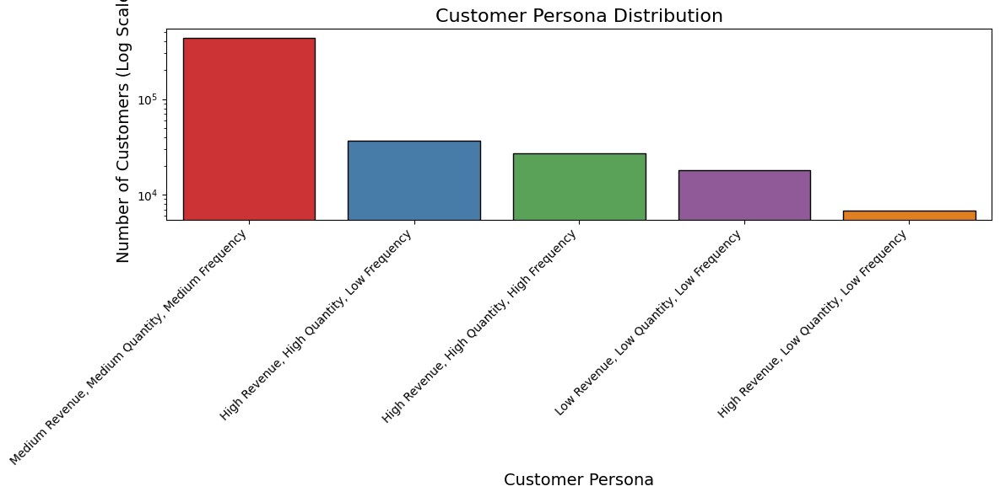

In [ ]:
persona_counts = data5['Customer_Persona'].value_counts()

plt.figure(figsize=(12, 6))
sns.barplot(
    x=persona_counts.index,
    y=persona_counts.values,
    palette='Set1',
    edgecolor='black'
)
plt.yscale('log')
plt.title('Customer Persona Distribution', fontsize=16)
plt.xlabel('Customer Persona', fontsize=14)
plt.ylabel('Number of Customers (Log Scale)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Insights:

*   The most customers are Normal household peoples.
*   There are people that have



In [ ]:

persona_groups = data5.groupby('Customer_Persona').agg({
    'Revenue': ['mean', 'sum'],
    'Quantity': ['mean', 'sum'],
    'Frequency': ['mean', 'sum']
}).reset_index()

persona_groups.columns = ['Persona', 'Avg_Revenue', 'Total_Revenue', 'Avg_Quantity', 'Total_Quantity', 'Avg_Frequency', 'Total_Frequency']

print("\nPersona Groups Summary:")
print(persona_groups)


Persona Groups Summary:
                                             Persona  Avg_Revenue  \
0        High Revenue, High Quantity, High Frequency    77.391516   
1         High Revenue, High Quantity, Low Frequency    60.704183   
2          High Revenue, Low Quantity, Low Frequency    24.114056   
3           Low Revenue, Low Quantity, Low Frequency     2.402329   
4  Medium Revenue, Medium Quantity, Medium Frequency    14.016681   

   Total_Revenue  Avg_Quantity  Total_Quantity  Avg_Frequency  Total_Frequency  
0    2083379.600     43.169391         1162120    1288.047400       34674236.0  
1    2218009.430     38.368165         1401896      60.298675        2203193.0  
2     163782.670      1.880448           12772      57.090106         387756.0  
3      43828.083      1.281024           23371      68.750877        1254291.0  
4    6133111.021      6.958753         3044858     715.380380      217645896.0  


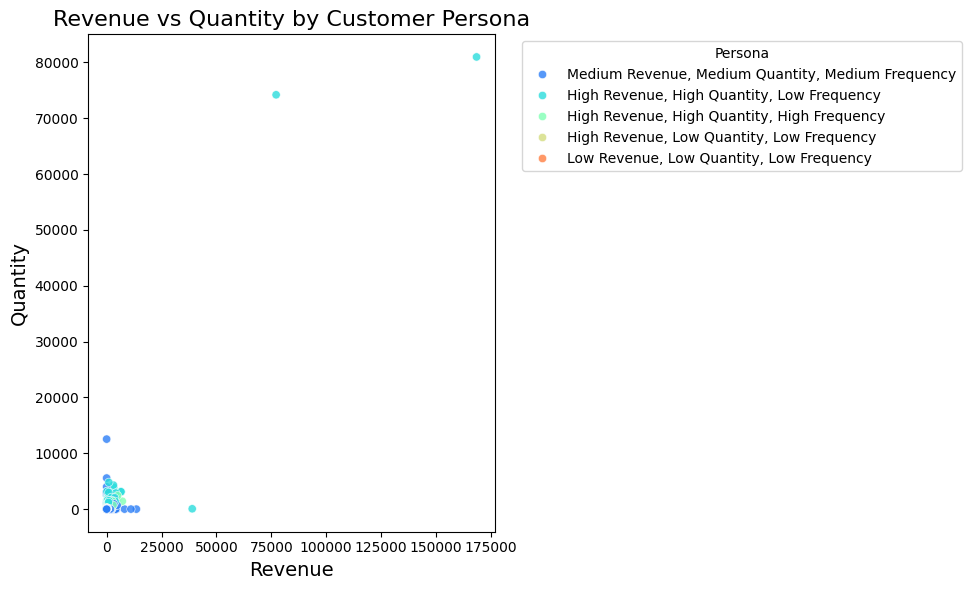

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='Revenue', y='Quantity', hue='Customer_Persona', data=data5,
    palette='rainbow',
    alpha=0.8
)
plt.title('Revenue vs Quantity by Customer Persona', fontsize=16)
plt.xlabel('Revenue', fontsize=14)
plt.ylabel('Quantity', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Persona")
plt.tight_layout()
plt.show()


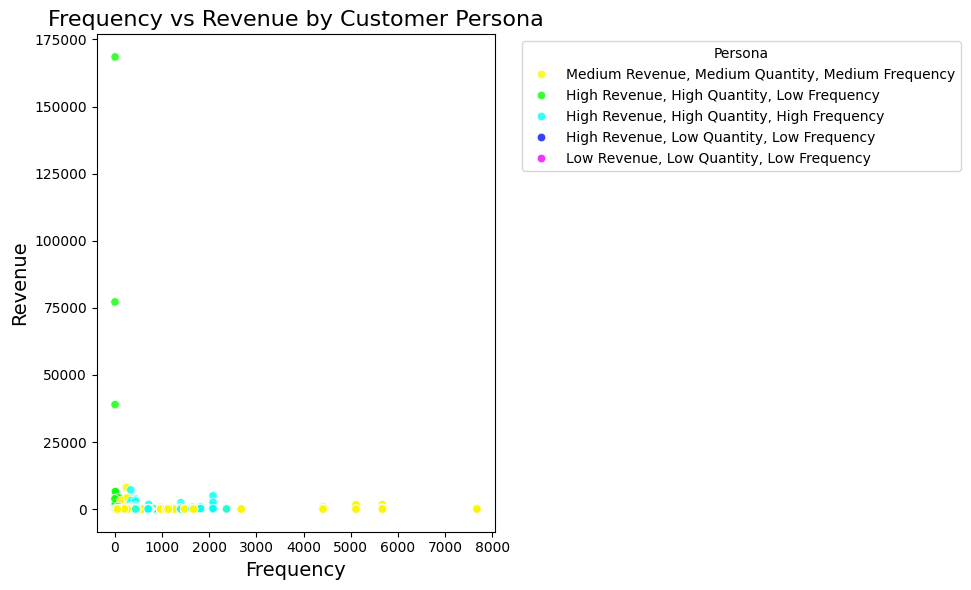

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='Frequency', y='Revenue', hue='Customer_Persona', data=data5,
    palette='hsv',
    alpha=0.8
)
plt.title('Frequency vs Revenue by Customer Persona', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Revenue', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Persona")
plt.tight_layout()
plt.show()


##Applying K Means

In [ ]:
data5['Customer_Persona'] = data5.apply(persona_label, axis=1)

encoder = OneHotEncoder()
encoded_personas = encoder.fit_transform(data5[['Customer_Persona']])
encoded_df = pd.DataFrame(encoded_personas.toarray(), columns=encoder.get_feature_names_out())
data5 = pd.concat([data5, encoded_df], axis=1)

clustering_features = ['Revenue', 'Quantity', 'Frequency']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data5[clustering_features])

imputer = SimpleImputer(strategy='mean')
scaled_features = imputer.fit_transform(scaled_features)


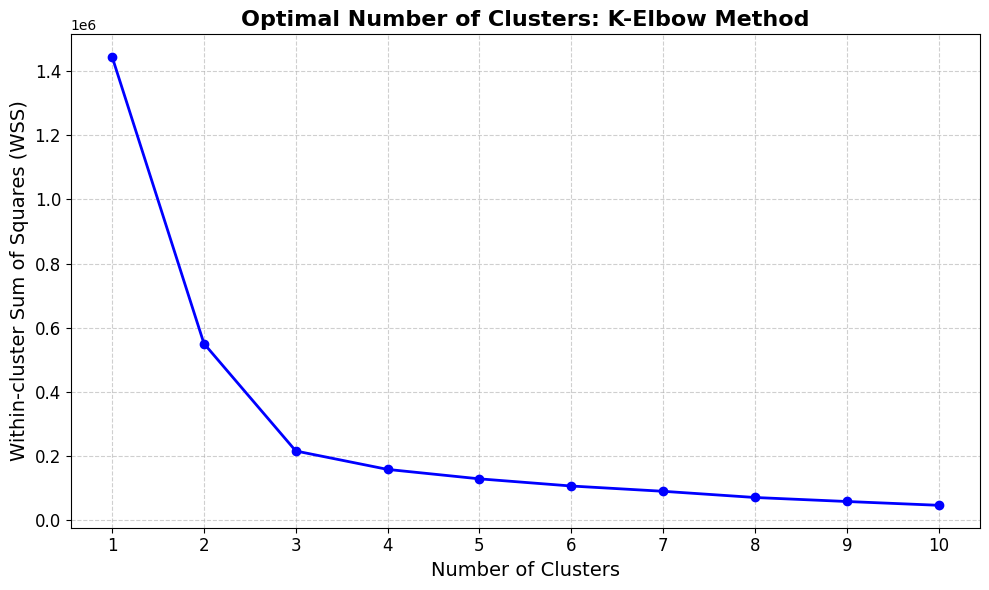

In [ ]:
#K-Elbow
wss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(scaled_features)
    wss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wss, marker='o', linestyle='-', color='b', linewidth=2)
plt.title('Optimal Number of Clusters: K-Elbow Method', fontsize=16, fontweight='bold')
plt.xlabel('Number of Clusters', fontsize=14)
plt.ylabel('Within-cluster Sum of Squares (WSS)', fontsize=14)
plt.xticks(range(1, 11), fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



In [ ]:
#KMeans cluster
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
data5['KMeans_Cluster'] = kmeans.fit_predict(scaled_features)

cluster_descriptions = {
    0: 'High Revenue Frequent Buyers',
    1: 'Low Revenue Infrequent Buyers',
    2: 'Moderate Revenue Frequent Buyers',
    3: 'High Revenue Infrequent Buyers',
    4: 'Low Revenue Frequent Buyers'
}
data5['Cluster_Name'] = data5['KMeans_Cluster'].map(cluster_descriptions)


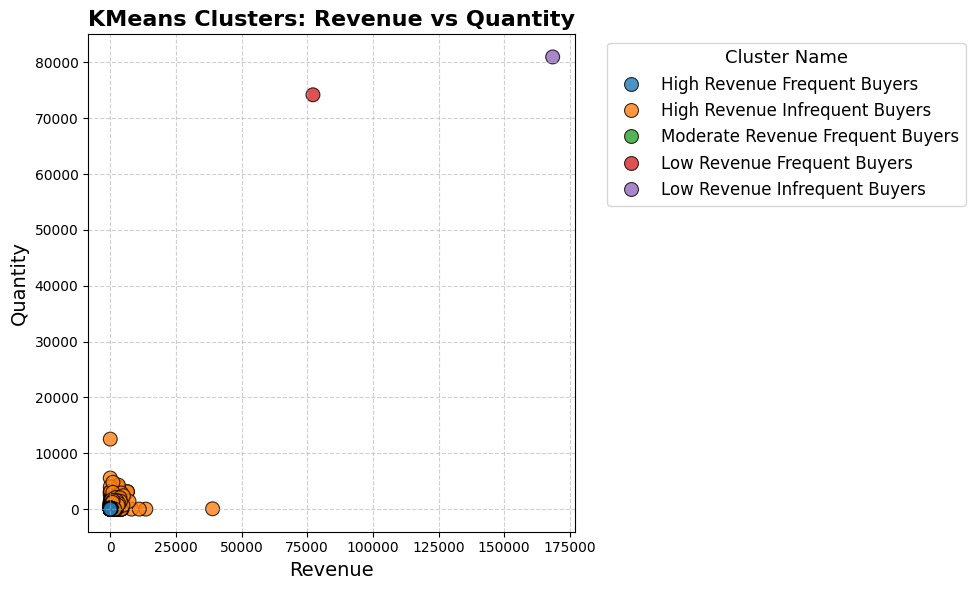

In [ ]:

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=data5['Revenue'], y=data5['Quantity'], hue=data5['Cluster_Name'],
    palette='tab10', alpha=0.8, s=100, edgecolor='k'
)
plt.title('KMeans Clusters: Revenue vs Quantity', fontsize=16, fontweight='bold')
plt.xlabel('Revenue', fontsize=14)
plt.ylabel('Quantity', fontsize=14)
plt.legend(title="Cluster Name", fontsize=12, title_fontsize=13, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


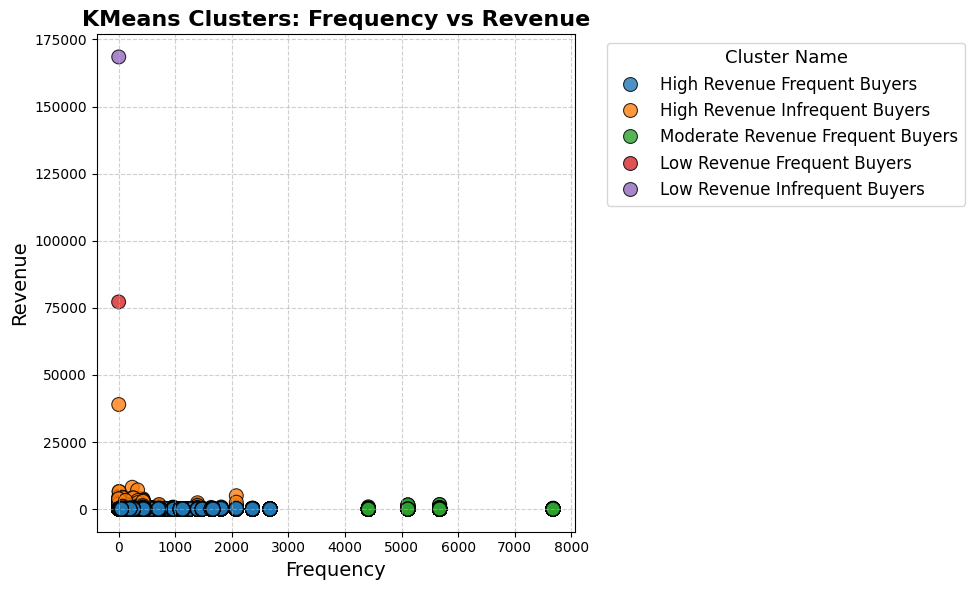

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=data5['Frequency'], y=data5['Revenue'], hue=data5['Cluster_Name'],
    palette='tab10', alpha=0.8, s=100, edgecolor='k'
)
plt.title('KMeans Clusters: Frequency vs Revenue', fontsize=16, fontweight='bold')
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Revenue', fontsize=14)
plt.legend(title="Cluster Name", fontsize=12, title_fontsize=13, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:

persona_groups = data5.groupby('Customer_Persona').agg({
    'Revenue': ['mean', 'sum'],
    'Quantity': ['mean', 'sum'],
    'Frequency': ['mean', 'sum']
}).reset_index()

persona_groups.columns = ['Persona', 'Avg_Revenue', 'Total_Revenue', 'Avg_Quantity', 'Total_Quantity', 'Avg_Frequency', 'Total_Frequency']

print("\nPersona Groups Summary:")
print(persona_groups)



Persona Groups Summary:
                                             Persona  Avg_Revenue  \
0        High Revenue, High Quantity, High Frequency    77.391516   
1         High Revenue, High Quantity, Low Frequency    60.704183   
2          High Revenue, Low Quantity, Low Frequency    24.114056   
3           Low Revenue, Low Quantity, Low Frequency     2.402329   
4  Medium Revenue, Medium Quantity, Medium Frequency    14.016681   

   Total_Revenue  Avg_Quantity  Total_Quantity  Avg_Frequency  Total_Frequency  
0    2083379.600     43.169391       1162120.0    1288.047400       34674236.0  
1    2218009.430     38.368165       1401896.0      60.298675        2203193.0  
2     163782.670      1.880448         12772.0      57.090106         387756.0  
3      43828.083      1.281024         23371.0      68.750877        1254291.0  
4    6133111.021      6.958753       3044858.0     715.380380      217645896.0  


In [ ]:
db_index = davies_bouldin_score(scaled_features, kmeans.labels_)
print(f"Davies-Bouldin Index: {db_index}")


Davies-Bouldin Index: 0.434189646221886


DB index should be as low as possible and this is a good clustering value.

In [ ]:
data6=data5.copy()

In [ ]:
data5.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Quantity_normalized,UnitPrice_normalized,...,Frequency,Frequency_segment,Customer_Persona,"Customer_Persona_High Revenue, High Quantity, High Frequency","Customer_Persona_High Revenue, High Quantity, Low Frequency","Customer_Persona_High Revenue, Low Quantity, Low Frequency","Customer_Persona_Low Revenue, Low Quantity, Low Frequency","Customer_Persona_Medium Revenue, Medium Quantity, Medium Frequency",KMeans_Cluster,Cluster_Name
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,0.000062,0.000188,...,297.0,Medium,"Medium Revenue, Medium Quantity, Medium Frequency",0.0,0.0,0.0,0.0,1.0,0,High Revenue Frequent Buyers
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0.000062,0.000250,...,297.0,Medium,"Medium Revenue, Medium Quantity, Medium Frequency",0.0,0.0,0.0,0.0,1.0,0,High Revenue Frequent Buyers
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,0.000086,0.000203,...,297.0,Medium,"Medium Revenue, Medium Quantity, Medium Frequency",0.0,0.0,0.0,0.0,1.0,0,High Revenue Frequent Buyers
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0.000062,0.000250,...,297.0,Medium,"Medium Revenue, Medium Quantity, Medium Frequency",0.0,0.0,0.0,0.0,1.0,0,High Revenue Frequent Buyers
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0.000062,0.000250,...,297.0,Medium,"Medium Revenue, Medium Quantity, Medium Frequency",0.0,0.0,0.0,0.0,1.0,0,High Revenue Frequent Buyers


In [ ]:
data5.shape

(541525, 28)

In [ ]:
print(data5.columns)

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Quantity_normalized',
       'UnitPrice_normalized', 'Revenue', 'Hour', 'Month', 'DayOfWeek',
       'TotalSpend', 'HourOfPurchase', 'Revenue_segment', 'Quantity_segment',
       'Frequency', 'Frequency_segment', 'Customer_Persona',
       'Customer_Persona_High Revenue, High Quantity, High Frequency',
       'Customer_Persona_High Revenue, High Quantity, Low Frequency',
       'Customer_Persona_High Revenue, Low Quantity, Low Frequency',
       'Customer_Persona_Low Revenue, Low Quantity, Low Frequency',
       'Customer_Persona_Medium Revenue, Medium Quantity, Medium Frequency',
       'KMeans_Cluster', 'Cluster_Name'],
      dtype='object')


In [ ]:

columns = [ 'InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Quantity_normalized',
       'UnitPrice_normalized', 'Revenue', 'Hour', 'Month', 'DayOfWeek',
       'TotalSpend', 'HourOfPurchase', 'Revenue_segment', 'Quantity_segment',
       'Frequency', 'Frequency_segment', 'Customer_Persona',
       'Customer_Persona_High Revenue, High Quantity, High Frequency',
       'Customer_Persona_High Revenue, High Quantity, Low Frequency',
       'Customer_Persona_High Revenue, Low Quantity, Low Frequency',
       'Customer_Persona_Low Revenue, Low Quantity, Low Frequency',
       'Customer_Persona_Medium Revenue, Medium Quantity, Medium Frequency',
       'KMeans_Cluster', 'Cluster_Name']

data = data5[columns]


numeric_columns = data.select_dtypes(include=[np.number]).columns
data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].mean())

# Standardize
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[numeric_columns])

vif_data = pd.DataFrame()
vif_data["Feature"] = numeric_columns
vif_data["VIF"] = [variance_inflation_factor(data_scaled, i) for i in range(data_scaled.shape[1])]

print(vif_data)


/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                                              Feature       VIF
0                                            Quantity       inf
1                                           UnitPrice       inf
2                                          CustomerID  1.012351
3                                 Quantity_normalized       inf
4                                UnitPrice_normalized       inf
5                                             Revenue       inf
6                                                Hour       inf
7                                               Month  1.014324
8                                           DayOfWeek  1.007989
9                                          TotalSpend       inf
10                                     HourOfPurchase       inf
11                                          Frequency  5.446713
12  Customer_Persona_High Revenue, High Quantity, ...       inf
13  Customer_Persona_High Revenue, High Quantity, ...       inf
14  Customer_Persona_High Revenue, Low Q

# Insight:
The VIF results indicate high multicollinearity in the dataset. Removing or combining the highly collinear features will help reduce this issue. After adjustments, recalculate VIF to ensure multicollinearity is minimized.

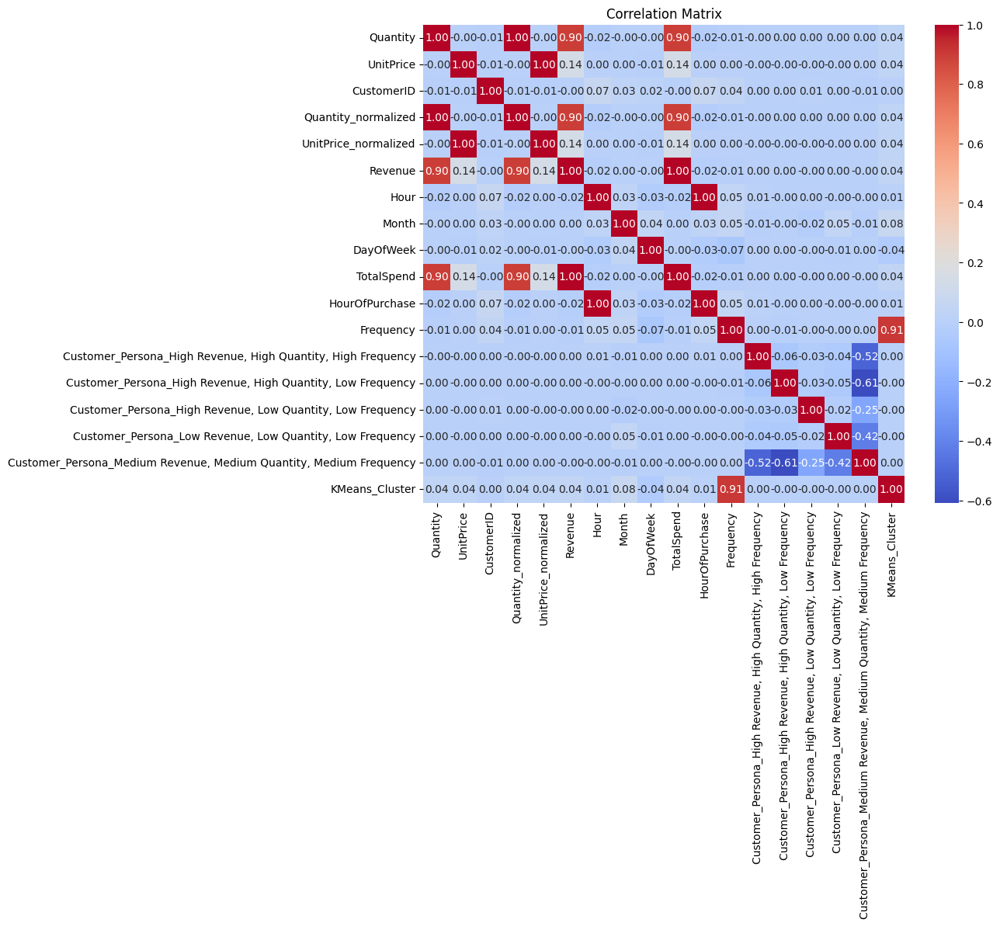

In [ ]:
correlation_matrix = data5.select_dtypes(include=np.number).corr()

# Display correlation matrix as heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

Similarly can be visulaized with the help of a correlation matrix.

   Revenue  Quantity  UnitPrice  Hour  Frequency
0    15.30       6.0       2.55   8.0      297.0
1    20.34       6.0       3.39   8.0      297.0
2    22.00       8.0       2.75   8.0      297.0
3    20.34       6.0       3.39   8.0      297.0
4    20.34       6.0       3.39   8.0      297.0


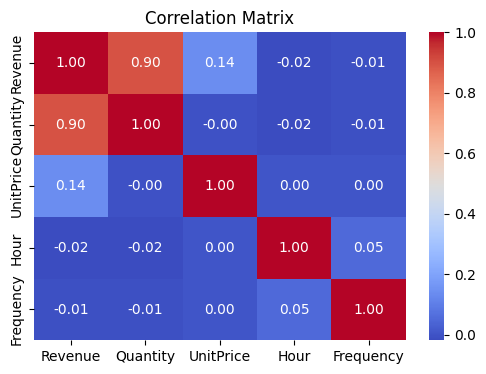

In [ ]:

data5 = data5[['Revenue','Quantity',  'UnitPrice', 'Hour', 'Frequency']]

print(data5.head())

correlation_matrix = data5.corr()

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()



*   Selecting a few important columns from the dataset.
*   Still Collinearity is high.



In [ ]:

columns = ['Quantity',  'UnitPrice', 'Hour', 'Frequency']

data = data5[columns]

data = data.replace([np.inf, -np.inf], np.nan)
data = data.fillna(data.mean())

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

vif_data = pd.DataFrame()
vif_data["Feature"] = columns
vif_data["VIF"] = [variance_inflation_factor(data_scaled, i) for i in range(data_scaled.shape[1])]

print(vif_data)


     Feature       VIF
0   Quantity  1.000403
1  UnitPrice  1.000038
2       Hour  1.002090
3  Frequency  1.001789


# Insight:
*   Low VIF values (close to 1) indicate minimal multicollinearity between features.

*   The features are stable and do not cause instability in the regression model.

*   No need for further adjustments to address multicollinearity.





In [ ]:
columns = ['Quantity','Revenue',  'UnitPrice', 'Hour', 'Frequency']

data = data5[columns]

data = data.dropna()

X = data.drop('Revenue', axis=1)
y = data['Revenue']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)


beta_coefficients = model.coef_


for feature, coefficient in zip(X.columns, beta_coefficients):
    print(f"Feature: {feature}, Coefficient: {coefficient}")



Feature: Quantity, Coefficient: 1.01674941489845
Feature: UnitPrice, Coefficient: 1.2995420258700718
Feature: Hour, Coefficient: -0.4549532773820307
Feature: Frequency, Coefficient: -0.0005863307956692765


# Beta Coefficients

The beta coefficients for the features indicate the following:

*   **Quantity (1.02):** A *strong positive influence* suggests that increases in quantity are closely associated with the Revenue.

*   **UnitPrice (1.30):** Another strong positive relationship, indicating that *higher prices significantly impact the Revenue*.

*   **Hour (-0.45):** A moderate *negative influence* suggests that the time of purchase inversely affects the Revenue, which might align with customer behavior patterns i.e; with the passing hour of day Revenue Decreases.

*   **Frequency (-0.0006):** *A very weak negative influence, likely negligible.*



Insight:
The model reflects meaningful trends in the data, particularly for Quantity and UnitPrice, which seem to dominate the prediction.
If Frequency is expected to play a larger role, further feature engineering or scaling might help improve its impact.

##RANDOM FOREST

In [ ]:
features = ['Quantity',  'UnitPrice', 'Hour', 'Frequency']
target = 'Revenue'



X = data5[features]
y = data5[target]


print(f"Number of NaNs in target variable 'Revenue': {y.isna().sum()}")


data5 = data5.dropna(subset=[target])


X = data5[features]
y = data5[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


Number of NaNs in target variable 'Revenue': 15473


RandomForestRegressor(random_state=42)

Mean Absolute Error (MAE): 0.16147558943465123
Mean Squared Error (MSE): 63.55494695394126
Root Mean Squared Error (RMSE): 7.972135658275094
R-squared (R²): 0.9896883920857036


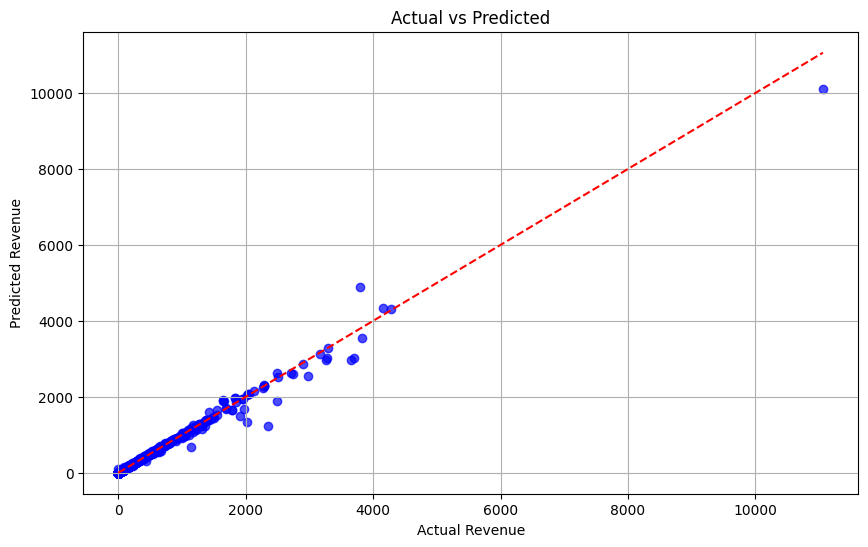

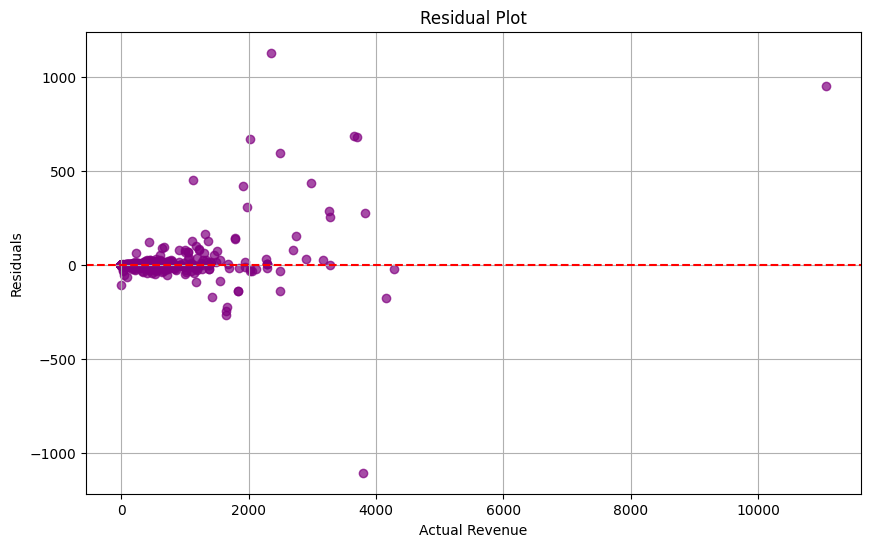

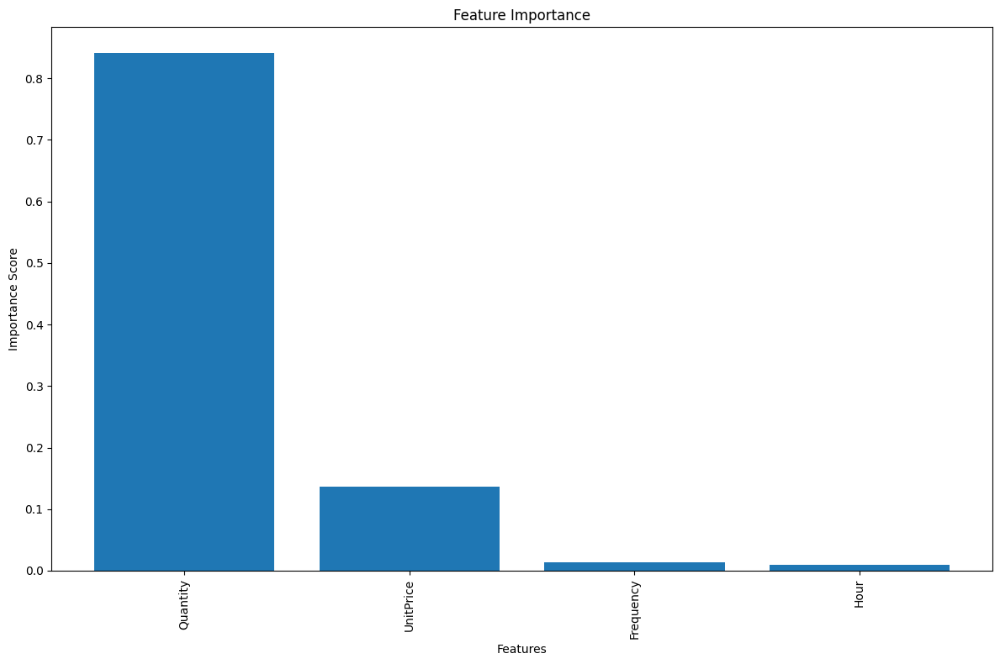

In [ ]:
y_pred = rf_model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")


plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='red')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Revenue')
plt.ylabel('Predicted Revenue')
plt.grid()
plt.show()

residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.7, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title('Residual Plot')
plt.xlabel('Actual Revenue')
plt.ylabel('Residuals')
plt.grid()
plt.show()


importances = rf_model.feature_importances_
feature_names = X_train.columns
sorted_indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.bar(range(X_train.shape[1]), importances[sorted_indices], align='center')
plt.xticks(range(X_train.shape[1]), feature_names[sorted_indices], rotation=90)
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.tight_layout()
plt.show()

In [ ]:
import joblib
joblib.dump(rf_model, 'Randomforest_rfm.pkl')

['Randomforest_rfm.pkl']